# STOFS Event-based Skill Assessment 
Here we are reading, subsetting and visualizing the forecast and nowcast data from STOFS-2D-Global and STOFS-3D-Atl data. We also read and plot reported water levels at CO-OPS stations. 

In [1]:
import dask
import geoviews as gv
import holoviews as hv
import numcodecs
import numpy as np
import pandas as pd
import geopandas as gpd
from cartopy.feature import NaturalEarthFeature
from matplotlib import pyplot

import shapely
import xarray as xr
import matplotlib.pyplot as plt
import s3fs  # Importing the s3fs library for accessing S3 buckets
import time  # Importing the time library for recording execution time
import shapely  # Importing shapely for geometric operations 
import thalassa  # Importing thalassa library for STOFS data analysis
from thalassa import api  # Importing thalassa API for data handling
from thalassa import normalization
from thalassa import utils
from holoviews import opts as hvopts
from holoviews import streams
from holoviews.streams import PointerXY
from holoviews.streams import Tap
import bokeh.plotting as bp
from datetime import datetime, timedelta, timezone
import searvey
from searvey.coops import get_coops_stations
from searvey._coops_api import fetch_coops_station
import tempfile
import pygrib
import math
from typing import List
from stormevents.nhc import nhc_storms, VortexTrack
from stormevents import StormEvent

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Input Parameters for Event Analysis


- **bucket_name_2d**: Name of the S3 bucket storing STOFS-2d-global data.
- **bucket_name_3d**: Name of the S3 bucket storing STOFS-3d-Atl data.
- **date_range**: Date range in YYYYMMDD format for analysis.
- **cycles_2d**: List of cycle times (in HH format, e.g., 00, 06, 12, 18) for STOFS-2d-Global forecasts.
- **Hours_before_landfall**: Number of hours before landfall for analysis.
- **Region**: Bounding box string defining the region of interest (min_lon, max_lon, min_lat, max_lat).
- **Event_name**: Name of the storm for hurricane track data extraction and file naming.
- **STOFS_file_2d**: File from STOFS-2d-Global for water level skill assessment.
- **STOFS_file_3d**: File from STOFS-3d-Atl for water level skill assessment.




In [2]:
# Info of STOFS data

bucket_name_2d   = 'noaa-gestofs-pds'
bucket_name_3d  = 'noaa-nos-stofs3d-pds'
date_range         = ['20240910','20240712']  
landfall_time_step = 70 # hours after start date from the date range input
cycles_2d        = ['00', '06', '12', '18']  
Hours_before_landfall = 48 # For reading Forecast data
Region       = 'NaN'  # select 'NaN' if you want to use region based on storm track or use (longitude_min, longitude_max, latitude_min, latitude_max) e.g. (-96, -94, 28, 30) 
Event_name = 'Hurricane FRANCINE'
storm_name = 'francine'
storm_year = 2024
advisory = 'BEST' #'OFCL' for latest forecast and change it to 'BEST' if best track is available 
STOFS_file_2d   = 'points.cwl'
STOFS_file_3d   = 'points.cwl'
STOFS_file_2d_noanomaly = 'points.cwl.noanomaly'



## Hurricane Track Visualization: Optional, Skip if Storm Track Data is Not Needed


In [3]:
# Load storm and obtain isobars from stormevent  
storm = StormEvent(storm_name, storm_year)

#By default, retrieves data from the BEST track file deck (b). You can specify that you want the ADVISORY (a) or FIXED (f) file decks with the file_deck parameter.
#storm_track = storm.track() #storm.track(file_deck='a')
if advisory=='BEST':
    storm_track = storm.track()
else:    
    storm_track = storm.track(file_deck='a')
#storm_track.data[storm_track.data['advisory']=='BEST']

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/stormevents/nhc/track.py:1137: RuntimeWarning: invalid value encountered in divide
  speeds = pandas.Series(distances / abs(intervals), index=indices)
/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/stormevents/nhc/track.py:1137: RuntimeWarning: invalid value encountered in divide
  speeds = pandas.Series(distances / abs(intervals), index=indices)


In [4]:
def get_storm_track_date(storm_track, advisory):
    if advisory == 'BEST':

      for idx in storm_track.linestrings[advisory]:
          track_date = idx
    else:
      for idx in storm_track.wind_swaths(wind_speed=64)[advisory]:
        track_date = idx
    return track_date

In [5]:
# get start and end date of storm
#track_date = get_storm_track_date(storm_best_track, 'BEST')
track_date = get_storm_track_date(storm_track, advisory)
storm_start_date = storm_track.start_date.strftime('%Y%m%d')
storm_end_date = storm_track.end_date.strftime('%Y%m%d') 
date_range = (storm_start_date, storm_end_date)
date_range

('20240909', '20240914')

In [6]:
gdf_countries = gpd.GeoSeries(NaturalEarthFeature(category='physical', scale='10m', name='land').geometries(), crs=4326)
gdf_countries

0     MULTIPOLYGON (((-0.00029 -71.49903, 0.01555 -7...
1     MULTIPOLYGON (((166.13697 -50.86435, 166.20525...
2     MULTIPOLYGON (((-78.78897 -33.60906, -78.78038...
3     MULTIPOLYGON (((163.98512 -20.04762, 163.98609...
4     MULTIPOLYGON (((134.70737 -6.58904, 134.72006 ...
5     MULTIPOLYGON (((-80.05989 -2.66277, -80.01452 ...
6     MULTIPOLYGON (((81.87599 7.09195, 81.87843 7.0...
7     MULTIPOLYGON (((55.01800 24.97651, 55.01580 24...
8     MULTIPOLYGON (((134.68979 33.82807, 134.72203 ...
9     MULTIPOLYGON (((14.76303 68.49486, 14.71746 68...
10    POLYGON ((-0.00479 -0.00439, -0.00479 0.00482,...
dtype: geometry

In [7]:
geometries = list(NaturalEarthFeature(category='physical', scale='50m', name='land').geometries())
land_gdf = gpd.GeoDataFrame(geometry=geometries, crs='EPSG:4326')
land_gdf

,geometry
0,"POLYGON ((179.99922 -16.16855, 179.84824 -16.3..."
1,"POLYGON ((177.23418 -17.14707, 177.18281 -17.1..."
2,"POLYGON ((127.37266 0.79131, 127.33838 0.75845..."
3,"POLYGON ((-81.33481 24.65049, -81.36479 24.629..."
4,"POLYGON ((-80.82939 24.80366, -80.84834 24.803..."
...,...
1415,"POLYGON ((-166.10986 66.22744, -166.14863 66.2..."
1416,"POLYGON ((-86.71401 21.23931, -86.69629 21.191..."
1417,"POLYGON ((54.46543 24.44277, 54.45664 24.42334..."
1418,"POLYGON ((-81.78384 24.54458, -81.80923 24.542..."


In [8]:
#gpd.sjoin(storm_track.data[storm_track.data['advisory']=='BEST'], land_gdf, how='inner')


In [9]:
def plot_isobar_domains(storm_track, track_date, gdf_countries):
    figure, axis = plt.subplots(1, 1)
    figure.set_size_inches(12, 12 / 1.618)
    
    # track_date = get_storm_track_date(storm_track, 'BEST')

    axis.plot(*storm_track.wind_swaths(wind_speed=34)[advisory][track_date].exterior.xy, 
              c='limegreen', label='34 kt')
    axis.plot(*storm_track.wind_swaths(wind_speed=50)[advisory][track_date].exterior.xy, 
              c='blue', label='50 kt')
    axis.plot(*storm_track.wind_swaths(wind_speed=64)[advisory][track_date].exterior.xy, 
              c='red', label='64 kt')
    axis.plot(*storm_track.linestrings[advisory][track_date].xy, 
              c='black',label='track')
    
    xlim = axis.get_xlim()
    ylim = axis.get_ylim()
    
    gdf_countries.plot(color='lightgrey', ax=axis, zorder=-1)
    
    axis.set_xlim(xlim)
    axis.set_ylim(ylim)
    axis.legend()
    axis.set_title(f'{storm_track.name}_{storm_track.year}  track windswatch')
    figure.savefig(f'{storm_track.name}_{storm_track.year}_track_windswatch.png')

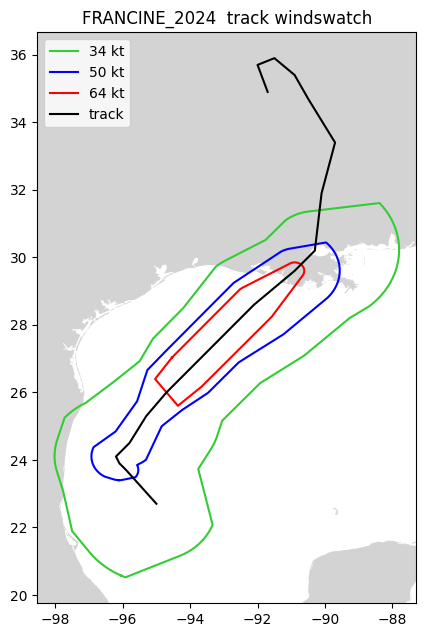

In [10]:
plot_isobar_domains(storm_track, track_date, gdf_countries)


# Read STOFS-2d-Global Nowcast Data on the Fly

In [11]:
def read_netcdf_from_s3(bucket_name, key):
    """
    Function to read a NetCDF file from an S3 bucket using thalassa API.
    
    Parameters:
    - bucket_name: Name of the S3 bucket
    - key: Key/path to the NetCDF file in the bucket
    
    Returns:
    - ds: xarray Dataset containing the NetCDF data
    """
    s3 = s3fs.S3FileSystem(anon=True)
    url = f"s3://{bucket_name}/{key}"
    ds = xr.open_dataset(s3.open(url, 'rb'), drop_variables=['nvel'])
    return ds



In [12]:
# Read STOFS-2d-global

bucket_name = bucket_name_2d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)

nowcast_2d_all_list = []
for date in dates:
    for cycle in cycles_2d:
         base_key = f'stofs_2d_glo.{date}'
         filename = f't{cycle}z.{STOFS_file_2d}.nc'
         key = f'{base_key}/stofs_2d_glo.{filename}'
         try:
            dataset_2d = read_netcdf_from_s3(bucket_name, key)


            # Check if dataset_2d exists and has data
            if dataset_2d is not None:
                nowcast_2d = dataset_2d.isel(time=slice(0, 60))  # First 60 time steps (nowcast data)
                nowcast_2d_all_list.append(nowcast_2d)
         except Exception as e:
            print(f'Error reading file {key} from S3: {str(e)}')

nowcast_2d_all_out_of_range = xr.concat(nowcast_2d_all_list, dim='time')

nowcast_2d_all = nowcast_2d_all_out_of_range.sel(time=slice(start_date, end_date))    # a xarray data set containing all the nowcast data for the specidified range

nowcast_2d_all

<xarray.Dataset> Size: 180MB
Dimensions:       (time: 1441, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 12kB 2024-09-09 ... 2024-09-15
Dimensions without coordinates: station
Data variables:
    station_name  (time, station) |S50 122MB b'PSBM1 SOUS41 8410140 ME Eastpo...
    x             (time, station) float64 19MB -66.98 -67.2 ... -51.01 -25.5
    y             (time, station) float64 19MB 44.9 44.65 44.39 ... 58.96 58.96
    zeta          (time, station) float64 19MB -1.68 -1.298 ... -0.4678 -0.3418
Attributes: (12/50)
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    description:        2024090900 :-6 hr nowcast and +180 hr forecast ! 32 C...
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

In [13]:
# Read STOFS-2d-global noanomaly
bucket_name = bucket_name_2d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)

nowcast_2d_noanomaly_all_list = []
for date in dates:
    for cycle in cycles_2d:
         base_key = f'stofs_2d_glo.{date}'
         filename = f't{cycle}z.{STOFS_file_2d_noanomaly}.nc'
         key = f'{base_key}/stofs_2d_glo.{filename}'
         try:
            dataset_2d = read_netcdf_from_s3(bucket_name, key)


            # Check if dataset_2d exists and has data
            if dataset_2d is not None:
                nowcast_2d = dataset_2d.isel(time=slice(0, 60))  # First 60 time steps (nowcast data)
                nowcast_2d_noanomaly_all_list.append(nowcast_2d)
         except Exception as e:
            print(f'Error reading file {key} from S3: {str(e)}')

nowcast_2d_noanomaly_all_out_of_range = xr.concat(nowcast_2d_noanomaly_all_list, dim='time')

nowcast_2d_noanomaly_all = nowcast_2d_noanomaly_all_out_of_range.sel(time=slice(start_date, end_date))    # a xarray data set containing all the nowcast data for the specidified range

nowcast_2d_noanomaly_all

<xarray.Dataset> Size: 180MB
Dimensions:       (time: 1441, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 12kB 2024-09-09 ... 2024-09-15
Dimensions without coordinates: station
Data variables:
    station_name  (time, station) |S50 122MB b'PSBM1 SOUS41 8410140 ME Eastpo...
    x             (time, station) float64 19MB -66.98 -67.2 ... -51.01 -25.5
    y             (time, station) float64 19MB 44.9 44.65 44.39 ... 58.96 58.96
    zeta          (time, station) float64 19MB -1.84 -1.428 ... -0.4678 -0.3418
Attributes: (12/51)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

# Read STOFS-3d-Atlantic Nowcast Data on the Fly

In [14]:
# Read STOFS-3d-Atlantic

bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)

nowcast_3d_all_list = []
for date in dates:
         base_key = f'stofs_3d_atl.{date}'
         filename = 't12z.points.cwl.nc'
         key = f'STOFS-3D-Atl/{base_key}/stofs_3d_atl.{filename}'
         try:
            dataset_3d = read_netcdf_from_s3(bucket_name, key)


            # Check if dataset_2d exists and has data
            if dataset_3d is not None:
                nowcast_3d = dataset_3d.isel(time=slice(0, 240))  # the first 24 hr (240 time steps are the nowcast data)
                nowcast_3d_all_list.append(nowcast_3d)
         except Exception as e:
            print(f'Error reading file {key} from S3: {str(e)}')
       

nowcast_3d_all_out_of_range = xr.concat(nowcast_3d_all_list, dim='time')

nowcast_3d_all = nowcast_3d_all_out_of_range.sel(time=slice(start_date, end_date))    # a xarray data set containing all the nowcast data for the specidified range

nowcast_3d_all   # a xarray data set containing all the nowcast data


<xarray.Dataset> Size: 17MB
Dimensions:       (time: 1441, station: 108)
Coordinates:
  * time          (time) datetime64[ns] 12kB 2024-09-09 ... 2024-09-15
Dimensions without coordinates: station
Data variables:
    zeta          (time, station) float64 1MB -1.693 -1.652 ... -0.1215 0.5174
    station_name  (time, station) |S50 8MB b'PSBM1 SOUS41 8410140 ME Eastport...
    x             (time, station) float64 1MB 44.9 44.66 43.66 ... 26.06 27.83
    y             (time, station) float64 1MB -66.98 -67.2 ... -97.22 -97.49
    u             (time, station) float64 1MB 1.619 0.08675 ... 0.123 -999.0
    v             (time, station) float64 1MB 0.4491 -0.01952 ... -0.1264 -999.0
    salinity      (time, station) float64 1MB 31.37 32.44 ... 26.54 -999.0
    temperature   (time, station) float64 1MB 11.77 12.57 ... 28.13 -999.0
Attributes:
    title:       SCHISM Model output
    source:      SCHISM model output version v10
    references:  http://ccrm.vims.edu/schismweb/
    history:     Mon Sep  9 18:04:50 2024: ncap2 -O -F -S /lfs/h1/ops/prod/pa...
    NCO:         netCDF Operators version 4.9.7 (Homepage = http://nco.sf.net...

# Find all the CO-OPs stations in the region using searvey

In [15]:
if Region == 'NaN':
   bbox = storm_track.wind_swaths(wind_speed=34)[advisory][track_date]
else:
   bbox = shapely.box(Region[0], Region[2], Region[1], Region[3])
station_ds= searvey.coops.coops_product_within_region('water_level', region=bbox, start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9)
, end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9))
station_ds


/tmp/ipykernel_9371/1708505699.py:5: DeprecationWarning: Call to deprecated function (or staticmethod) coops_product_within_region. (This function is deprecated and will be removed in the future. Replace it with `fetch_coops_station`.) -- Deprecated since version 0.4.0.
  station_ds= searvey.coops.coops_product_within_region('water_level', region=bbox, start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9)


<xarray.Dataset> Size: 773kB
Dimensions:  (t: 1441, nos_id: 22)
Coordinates:
  * t        (t) datetime64[ns] 12kB 2024-09-09 ... 2024-09-15
  * nos_id   (nos_id) object 176B '8739803' '8762075' ... '8764044' '8764227'
    nws_id   (nos_id) <U5 440B 'BLBA1' 'PTFL1' 'WFRA1' ... 'TESL1' 'AMRL1'
    x        (nos_id) float64 176B -88.25 -90.2 -88.16 ... -92.31 -91.24 -91.34
    y        (nos_id) float64 176B 30.41 29.11 30.38 30.44 ... 29.55 29.67 29.45
Data variables:
    v        (nos_id, t) float32 127kB 8.705 8.718 8.732 ... 7.275 7.268 7.265
    s        (nos_id, t) float32 127kB 0.004 0.004 0.002 ... 0.001 0.001 0.001
    f        (nos_id, t) object 254kB '0,0,0,0' '0,0,0,0' ... '0,0,0,0'
    q        (nos_id, t) object 254kB 'p' 'p' 'p' 'p' 'p' ... 'p' 'p' 'p' 'p'

# Find CO-OPS station in STOFS-2D-Global station list

In [16]:
# Create an empty list to collect zeta values
zeta_values_list = []
nos_id_points = []
x_values = []
y_values = []
names = []


# Loop over stations and extract zeta if any search string is found in the station name

station_id = np.sort(station_ds['nos_id'].values)

for nos_id in station_id:
  
    for station_index in range(len(nowcast_2d_all.station)):
        station_name = nowcast_2d_all.station_name[0,station_index].item().decode('utf-8').strip()
        if (nos_id in station_name):
           zeta_values = nowcast_2d_all.zeta[:, station_index]  # Extract zeta values for the current station
           x = nowcast_2d_all.x[0, station_index]
           y = nowcast_2d_all.y[0, station_index]
           # Save the availilbe stations in the station list
           nos_id_points.append(nos_id)
           zeta_values_list.append(zeta_values)
           x_values.append(x.item())
           y_values.append(y.item())
           names.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
all_zeta_values = np.concatenate(zeta_values_list, axis=0)

all_zeta_values = np.reshape(all_zeta_values, (int(len(all_zeta_values)/len(nowcast_2d_all.time)),len(nowcast_2d_all.time)))

# Sample data
data = {
    'latitude': y_values,
    'longitude':x_values ,
    'Name': names,
    'id':  nos_id_points,
}

# Create a DataFrame
df_2d = pd.DataFrame(data)

df_2d

,latitude,longitude,Name,id
0,30.250999,-88.073997,DILA1 SOUS42 8735180 AL Dauphin Island,8735180
1,30.565201,-88.087997,BYSA1 SOUS42 8735391 AL Dog River Bridge,8735391
2,30.649059,-88.057251,MCGA1 SOUS42 8736897 AL Coast Guard Sector Mobile,8736897
3,30.704599,-88.039597,OBLA1 SOUS42 8737048 AL Mobile State Docks,8737048
4,30.781981,-88.072029,CIKA1 SOUS42 8737138 AL Chickasaw Creek,8737138
5,30.367950,-88.563858,PNLM6 SOUS42 8741533 MS Pascagoula Noaa Lab,8741533
6,30.325710,-89.321999,WYCM6 SOUS42 8747437 MS Bay Waveland Yacht Club,8747437
7,29.176500,-89.259499,PILL1 SOUS42 8760721 LA Pilottown,8760721
8,28.931999,-89.407501,"PSTL1 SOUS42 8760922 LA Pilots Station East, S.W.",8760922
9,29.872499,-89.672997,SHBL1 SOUS42 8761305 LA Shell Beach,8761305


# Plot the stations for STOFS-2d-Global


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
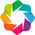

In [17]:
hv.extension("bokeh")

# Set some defaults for the visualization of the graphs
hvopts.defaults(
    hvopts.Image(
        width=800,
        height=600,
        show_title=True,
        tools=["hover"],
        active_tools=["pan", "box_zoom"],
    ),
)


# The tiles is using the tiling service from Open Street maps
tiles =  api.get_tiles() 

stations = (x_values,y_values)
kb = gv.Points(stations).opts(color="red", marker="circle_dot", size=10)


layout = tiles.opts(width=800, height = 850) * kb 
layout
from bokeh.plotting import show
show(hv.render(layout))


# Save the plot as a PNG 
#from bokeh.io import export_png

#renderer = hv.renderer('bokeh')

#bokeh_plot = renderer.get_plot(layout).state

#export_png(bokeh_plot, filename='visualization.png')


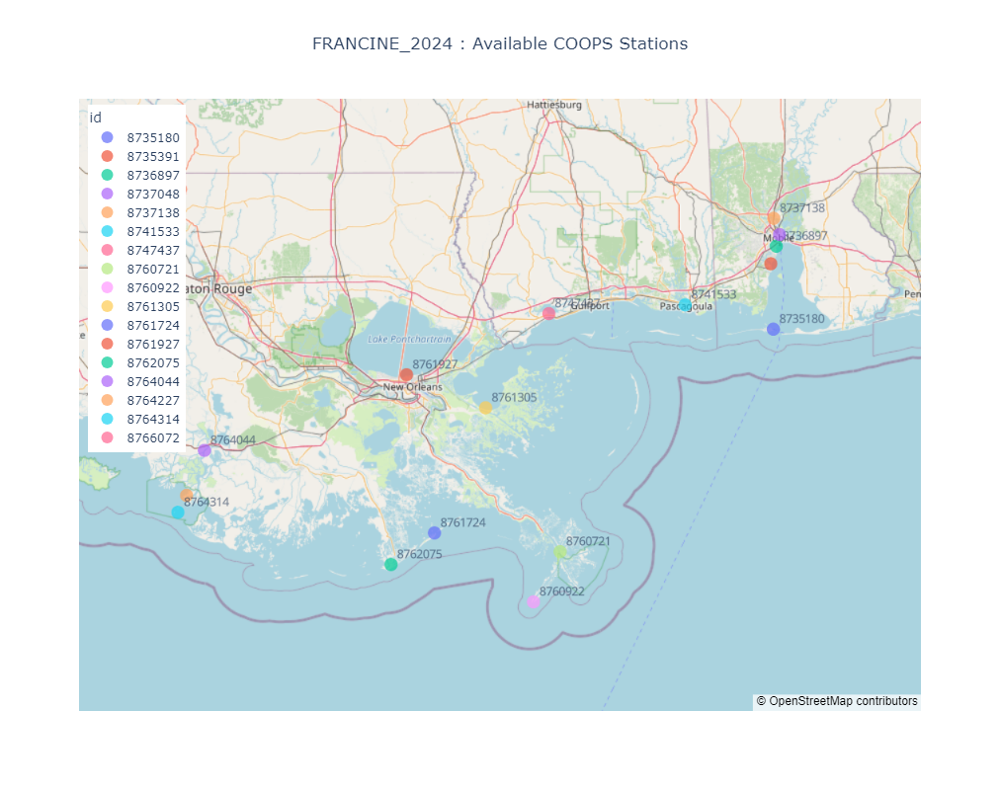

In [20]:
import plotly.express as px
import pandas as pd
import plotly.io as pio



# Create the scatter mapbox plot with red points
fig = px.scatter_mapbox(
    df_2d,
    lat='latitude',
    lon='longitude',
    center=dict(lat=df_2d['latitude'].mean(), lon=df_2d['longitude'].mean()),
    #color_discrete_sequence=['red'],  # Set the color of the points to red
    color = 'id',
    size=[1]*len(df_2d),  # Adjust the size of the markers if needed
    size_max = 10,
    text= 'id',
    hover_name='id',
    hover_data=['id', 'Name'],
    title= f'{storm_track.name}_{storm_track.year} : Available COOPS Stations',
    mapbox_style='open-street-map',  # Use OpenStreetMap for simplicity
    width=1000,  # Set the width of the figure
    height=800,  # Set the height of the figure
    zoom=7,  # Zoom level
)



fig.update_layout(
    
    title=dict(x=0.5),  # Center the title
    legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
)
)

fig.update_traces(textposition='top right')



# Show the plot
fig.show()
fig.write_html("file.html")
#fig.write_image("fig2.png")



In [21]:
# Find CO-OPS station in STOFS-2D-Global noanomaly station list

# Create an empty list to collect zeta values
zeta_values_noanomaly_list = []
x_values = []
y_values = []


# Loop over stations and extract zeta if any search string is found in the station name

station_id = np.sort(station_ds['nos_id'].values)

for nos_id in station_id:
  
    for station_index in range(len(nowcast_2d_all.station)):
        station_name = nowcast_2d_noanomaly_all.station_name[0,station_index].item().decode('utf-8').strip()
        if (nos_id in station_name):
           zeta_values = nowcast_2d_noanomaly_all.zeta[:, station_index]  # Extract zeta values for the current station
           # Save the availilbe stations in the station list
           zeta_values_noanomaly_list.append(zeta_values)
          
# Concatenate all zeta values into a single NumPy array
all_zeta_noanomaly_values = np.concatenate(zeta_values_noanomaly_list, axis=0)

all_zeta_noanomaly_values = np.reshape(all_zeta_noanomaly_values, (int(len(all_zeta_noanomaly_values)/len(nowcast_2d_noanomaly_all.time)),len(nowcast_2d_noanomaly_all.time)))


# Find CO-OPS station in STOFS-3D-Atlantic station list

In [22]:
# Create an empty list to collect zeta values
zeta_values_list_3d = []
nos_id_points_3d = []
x_values_3d = []
y_values_3d = []
names_3d = []


# Loop over stations and extract zeta if any search string is found in the station name

for nos_id in station_id:
    
     for station_index in range(len(nowcast_3d_all.station)):
        station_name = nowcast_3d_all.station_name[0,station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           zeta_values = nowcast_3d_all.zeta[:, station_index]  # Extract zeta values for the current station
           x = station_ds['x'][station_ds['nos_id']==nos_id]
           y = station_ds['y'][station_ds['nos_id']==nos_id]
           # Save the availilbe stations in the station list
           nos_id_points_3d.append(nos_id)
           zeta_values_list_3d.append(zeta_values)
           x_values_3d.append(x.item())
           y_values_3d.append(y.item())
           names_3d.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
all_zeta_values_3d = np.concatenate(zeta_values_list_3d, axis=0)

all_zeta_values_3d = np.reshape(all_zeta_values_3d, ( int(len(all_zeta_values_3d)/len(nowcast_3d_all.time)),len(nowcast_3d_all.time)))
nos_id_points_3d , names_3d

# Sample data
data = {
    'latitude':  y_values_3d,
    'longitude': x_values_3d ,
    'Name': names_3d,
    'id':  nos_id_points_3d,
}

# Create a DataFrame
df_3d = pd.DataFrame(data)

df_3d


,latitude,longitude,Name,id
0,30.250000,-88.074997,DILA1 SOUS42 8735180 AL Dauphin,8735180
1,30.649500,-88.058113,MCGA1 SOUS42 8736897 AL Coast,8736897
2,30.704611,-88.039612,OBLA1 SOUS42 8737048 AL Mobile,8737048
3,30.781900,-88.073601,CIKA1 SOUS42 8737138 AL Chickasaw,8737138
4,30.367781,-88.563057,PNLM6 SOUS42 8741533 MS Pascagoula,8741533
5,30.326340,-89.325798,WYCM6 SOUS42 8747437 MS Bay,8747437
6,29.868111,-89.673248,SHBL1 SOUS42 8761305 LA Shell,8761305
7,30.027220,-90.113327,NWCL1 SOUS42 8761927 LA New,8761927
8,29.667500,-91.237610,"TESL1 SOUS42 8764044 LA Berwick,",8764044
9,29.449600,-91.338097,"AMRL1 SOUS42 8764227 LA LAWMA,",8764227


# Plot the stations for STOFS-3d-Atlantic

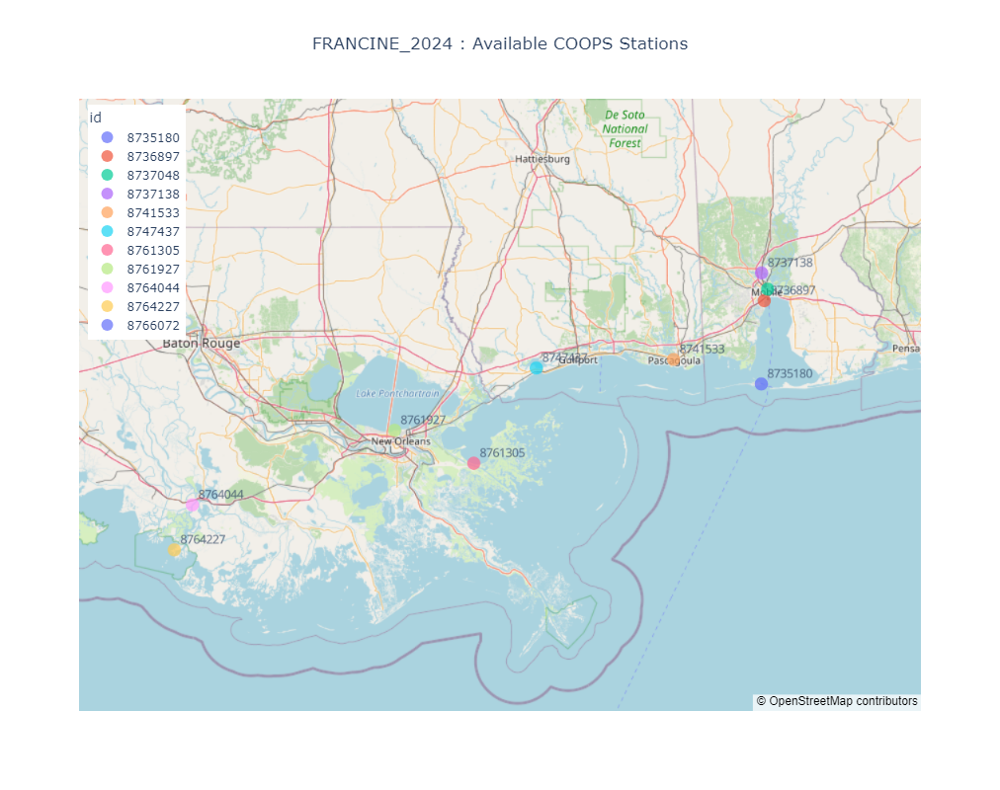

In [26]:


# Create the scatter mapbox plot with red points
fig = px.scatter_mapbox(
    df_3d,
    lat='latitude',
    lon='longitude',
    center=dict(lat=df_3d['latitude'].mean(), lon=df_3d['longitude'].mean()),
    #color_discrete_sequence=['red'],  # Set the color of the points to red
    color = 'id',
    size=[1]*len(df_3d),  # Adjust the size of the markers if needed
    size_max = 10,
    text= 'id',
    hover_name='id',
    hover_data=['id', 'Name'],
    title= f'{storm_track.name}_{storm_track.year} : Available COOPS Stations',
    mapbox_style='open-street-map',  # Use OpenStreetMap for simplicity
    width=1000,  # Set the width of the figure
    height=800,  # Set the height of the figure
    zoom=7,  # Zoom level
)



fig.update_layout(
    
    title=dict(x=0.5),  # Center the title
    legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
)
)

fig.update_traces(textposition='top right')



# Show the plot
fig.show()
fig.write_html("file.html")
#fig.write_image("fig3.png")


# Read Observation data for STOFS-2D-Global

In [27]:

# Initialize an empty DataFrame to store the data
Observation = []

# Loop over each nos_id
for nos_id in nos_id_points:
   
       # Retrieve water level information for the specified date range
       station= searvey.coops.COOPS_Station(int(nos_id)) 
       station_df = station.product(start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
, end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc), product='water_level',datum='MSL')
      

       # Add the data for the current station to the result DataFrame
       Observation.append(station_df['v'].values)



In [28]:
# Initialize an empty DataFrame to store the data
Observation = []

# Loop over each nos_id
for nos_id in nos_id_points:
   
       # Retrieve water level information for the specified date range
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='MSL')
      

       # Add the data for the current station to the result DataFrame
       Observation.append(station_df['value'].values)


# Read Observation data for STOFS-3D-Atlantic

In [29]:

# Initialize an empty DataFrame to store the data
Observation_3d = []

# Loop over each nos_id
for nos_id in nos_id_points_3d:
   
       # Retrieve water level information for the specified date range
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(nowcast_3d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(nowcast_3d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='NAVD')
      

       # Add the data for the current station to the result DataFrame
       Observation_3d.append(station_df['value'].values)



# Plot Nowcast Time series STOFS-2D-Global

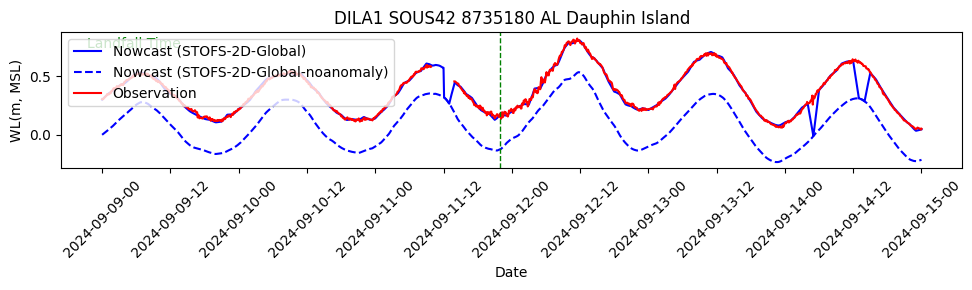

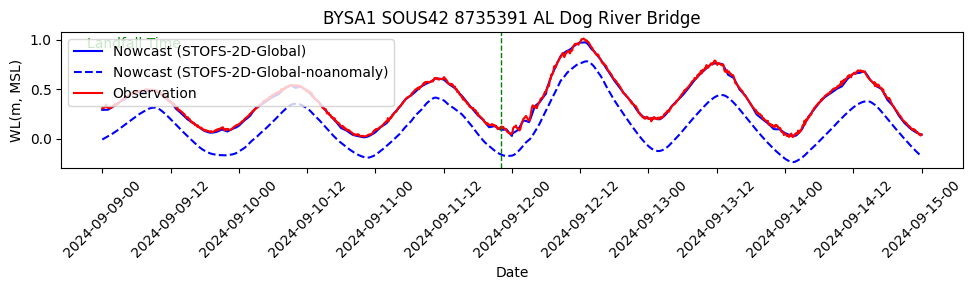

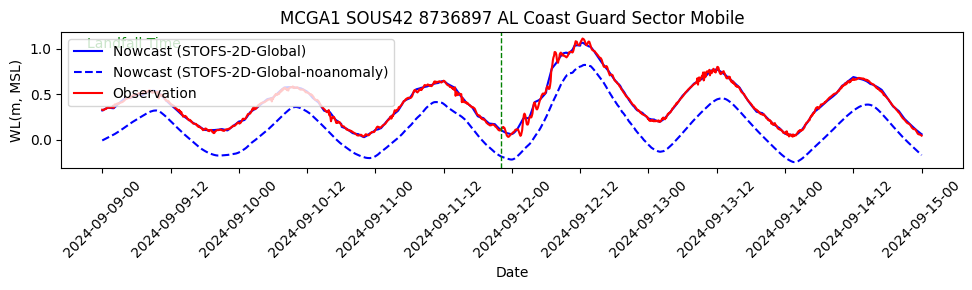

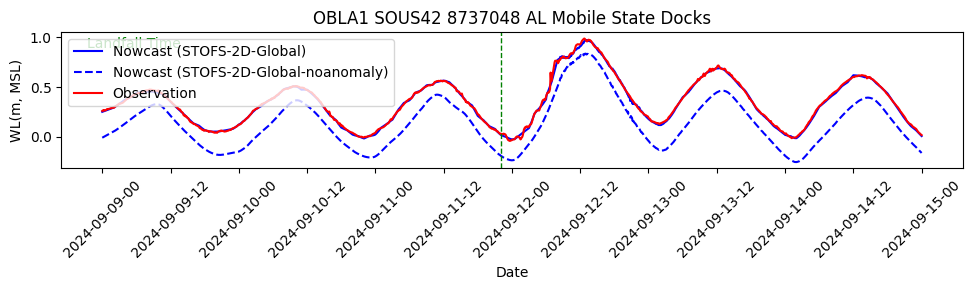

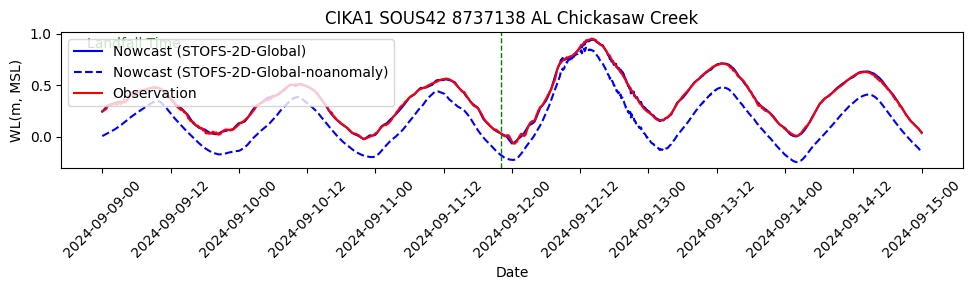

...

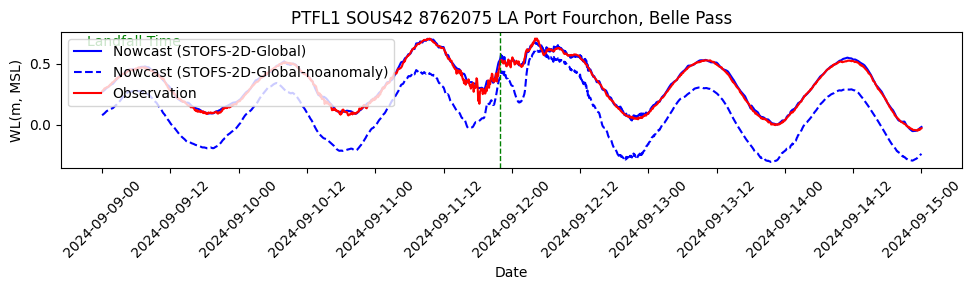

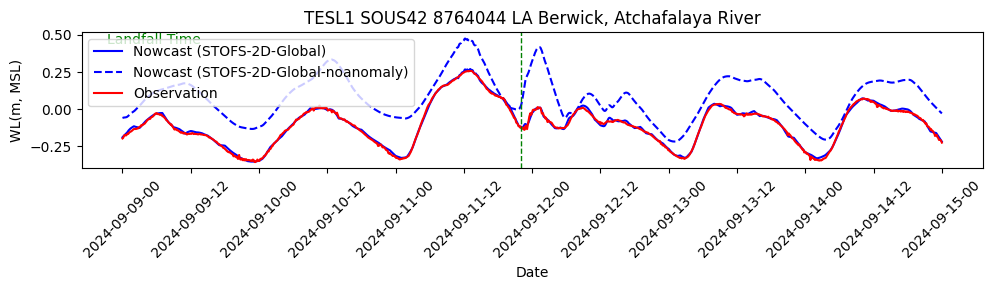

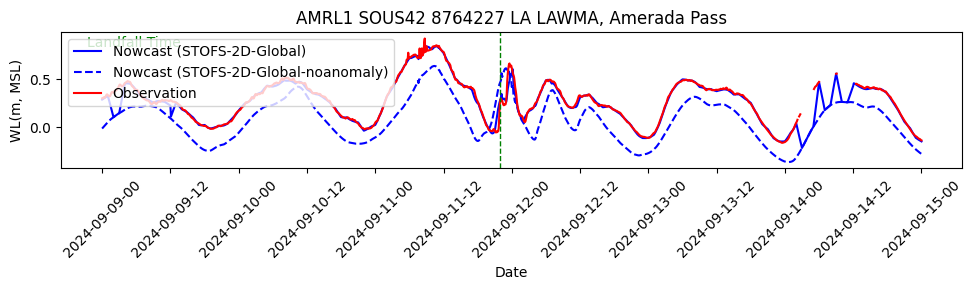

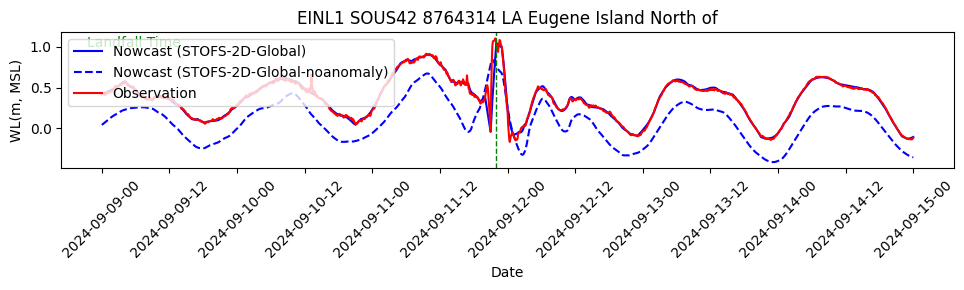

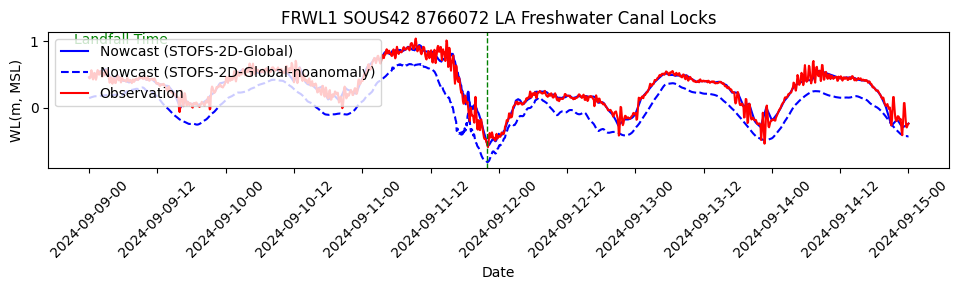

In [30]:

def convert_to_datetime(time_step):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)  
    return start_date + time_step * time_delta


index = 0

for nos_id in nos_id_points:
    
    fig, ax = plt.subplots(figsize=(10, 3))

    ax.plot(all_zeta_values[index,:], label='Nowcast (STOFS-2D-Global)', color='blue')
    ax.plot(all_zeta_noanomaly_values[index,:], label='Nowcast (STOFS-2D-Global-noanomaly)', color='blue', linestyle='dashed')
    ax.plot(Observation[index], label='Observation', color='red')

    ax.set_title(names[index])
        
    ax.set_xlabel('Date')

   
    # Set x ticks and labels
    ax.set_xticks(range(0, len(all_zeta_values[index, :]), 120)) 
    time_steps = range(0, len(all_zeta_values[index, :]))
    time_labels = [convert_to_datetime(step) for step in time_steps]

    selected_dates = time_labels[::120]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)

    ax.axvline(x=landfall_time_step*10, color='green', linestyle='--', linewidth=1)
    ax.text(landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
    ax.set_ylabel('WL(m, MSL)')
    ax.legend(loc = 'upper left')
    plt.tight_layout()
    plt.show()
    index = index+1

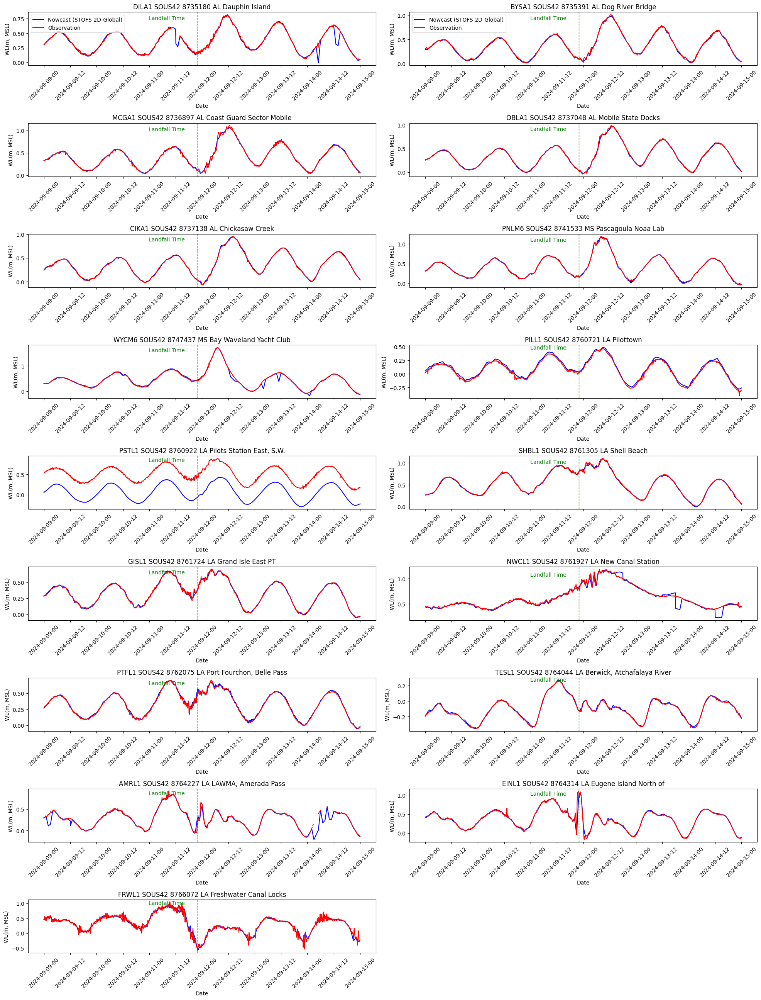

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import timedelta

def convert_to_datetime(time_step, date_range):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 9
num_cols = 2

# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))

index = 0
for row in range(num_rows):
    for col in range(num_cols):
        
        if index >= len(nos_id_points):
            # If there are fewer stations than subplots, turn off unused subplots
            axs[row, col].axis('off')
            break
        ax = axs[row, col]
    
        #ax.plot(all_zeta_noanomaly_values[index, :], label='Nowcast (STOFS-2D-Global-noanomaly)', color='blue', linestyle='dotted')
        #ax.plot(all_zeta_para_values[index, :], label='Nowcast (STOFS-2D-Global-new)', color='blue', linestyle='dashed')
        ax.plot(all_zeta_values[index, :], label='Nowcast (STOFS-2D-Global)', color='blue')
        ax.plot(Observation[index], label='Observation', color='red')
        ax.set_title(names[index])
            
        ax.set_xlabel('Date')
            
        # Set x ticks and labels
        ax.set_xticks(range(0, len(all_zeta_values[index, :]), 120))
        time_steps = range(0, len(all_zeta_values[index, :]))
        time_labels = [convert_to_datetime(step, date_range) for step in time_steps]
        selected_dates = time_labels[::120]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
            
            
        ax.axvline(x=landfall_time_step*10, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*10*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
            
        ax.set_ylabel('WL(m, MSL)')
        if row == 0 :
            ax.legend(loc='upper left')
        
        index += 1
            
          
# Adjust layout
plt.tight_layout()
plt.savefig(f'nowcast_2d_{Event_name}')  # Save the figure
plt.show()

# Plot Nowcast Time series STOFS-3D-Atlantic

In [32]:

def convert_to_datetime(time_step):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)  
    return start_date + time_step * time_delta



index_3d = 0 

for nos_id in nos_id_points_3d:
    
    fig, ax = plt.subplots(figsize=(10, 3))
       
    ax.plot(all_zeta_values_3d[index_3d,:], label='Nowcast (STOFS-3D-Atlantic)', color='blue')        
    ax.plot(Observation_3d[index_3d], label='Observation', color='red')
    ax.set_title(names_3d[index_3d])
        
    ax.set_xlabel('Date')
    
    # Set x ticks and labels
    ax.set_xticks(range(0, len(all_zeta_values_3d[index_3d, :]), 120)) 
    time_steps = range(0, len(all_zeta_values_3d[index_3d, :]))
    time_labels = [convert_to_datetime(step) for step in time_steps]

    
    # Calculate the landfall time step
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    landfall_datetime = start_date + timedelta(hours=landfall_time_step)
    print(landfall_datetime)
    nowcast_3d_landfall_time_step = None 
    
    for step, time_label in zip(time_steps, time_labels): 

        if time_label.replace(tzinfo = None) == landfall_datetime:
            nowcast_3d_landfall_time_step = step 
            break   
            
    selected_dates = time_labels[::120]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        
    print(nowcast_3d_landfall_time_step)       
    ax.axvline(x=nowcast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
    ax.text(nowcast_3d_landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')

    ax.set_ylabel('WL(m, NAVD88)')
    ax.legend(loc = 'upper left')
    plt.tight_layout()
    plt.show()
    index_3d = index_3d+1 


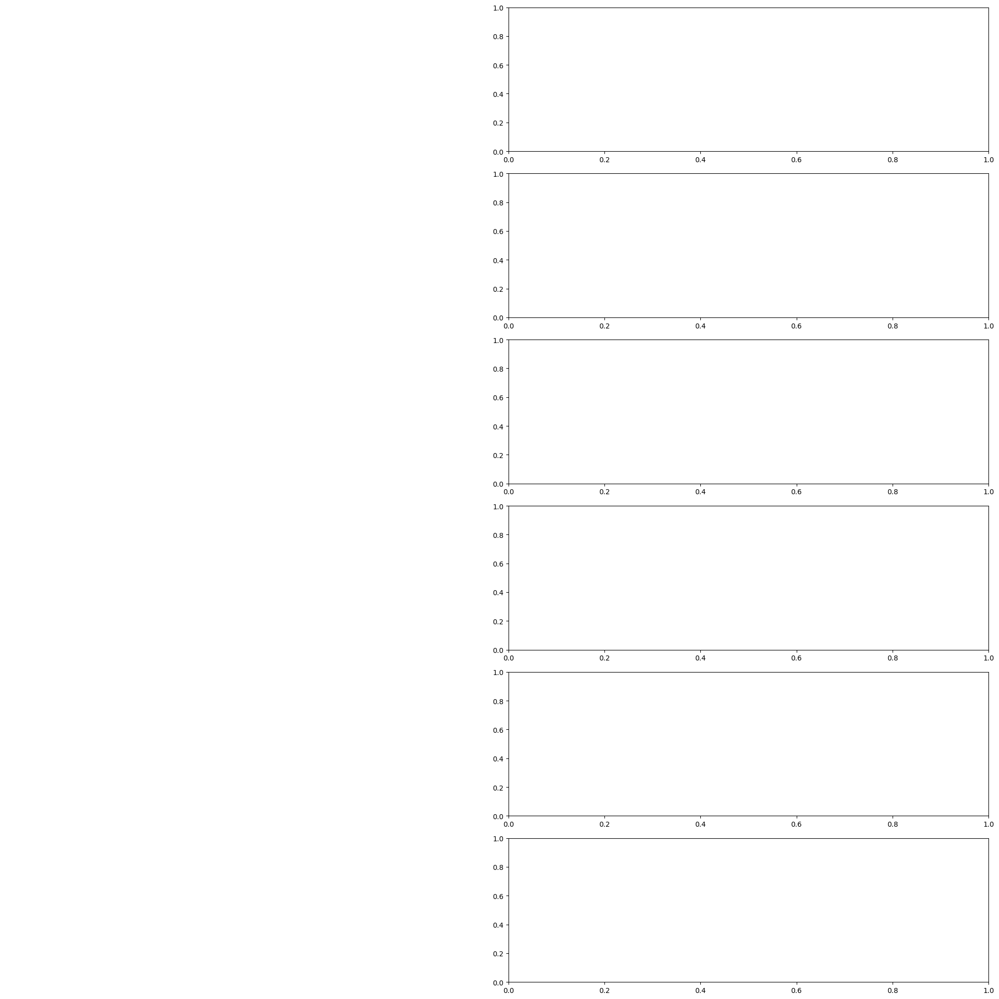

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import timedelta

def convert_to_datetime(time_step, date_range):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 6
num_cols = 2

# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20))

index = 0
for row in range(num_rows):
    for col in range(num_cols):
        
        if index >= len(nos_id_points_3d):
            # If there are fewer stations than subplots, turn off unused subplots
            axs[row, col].axis('off')
            break
        ax = axs[row, col]
    
        #ax.plot(all_zeta_noanomaly_values[index, :], label='Nowcast (STOFS-2D-Global-noanomaly)', color='blue', linestyle='dotted')
        #ax.plot(all_zeta_para_values[index, :], label='Nowcast (STOFS-2D-Global-new)', color='blue', linestyle='dashed')
        ax.plot(all_zeta_values_3d[index, :], label='Nowcast (STOFS-3D-Atlantic)', color='blue')
        ax.plot(Observation_3d[index], label='Observation', color='red')
        ax.set_title(names_3d[index])
            
        ax.set_xlabel('Date')
            
        # Set x ticks and labels
        ax.set_xticks(range(0, len(all_zeta_values_3d[index, :]), 120))
        time_steps = range(0, len(all_zeta_values_3d[index, :]))
        time_labels = [convert_to_datetime(step, date_range) for step in time_steps]
        selected_dates = time_labels[::120]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
            
            
        ax.axvline(x=landfall_time_step*10, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*0.8*10, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
            
        ax.set_ylabel('WL(m, NAVD88)')
        if row == 0 :
            ax.legend(loc='upper left')
        
        index += 1
            
          
# Adjust layout
plt.tight_layout()
plt.savefig(f'nowcast_3d_{Event_name}')  # Save the figure
plt.show()

# Convert STOFS-3D-Atl datum to MSL and plot both time series in one figure

In [34]:

# From VDatum Package
Conversion_values = [0.102,0.145,0.151, 'NaN','NaN', 0.167, 0.195, 0.066, 0.445, -0.282,-0.464]


all_zeta_values_3d_MSL = []
nos_id_MSL = []
for index in range(0, all_zeta_values_3d.shape[0]):
    try:
       all_zeta_values_3d_MSL.append(all_zeta_values_3d[index] - Conversion_values[index]) 
       nos_id_MSL.append(nos_id_points_3d[index])
    except:
       pass
nos_id_MSL

[]

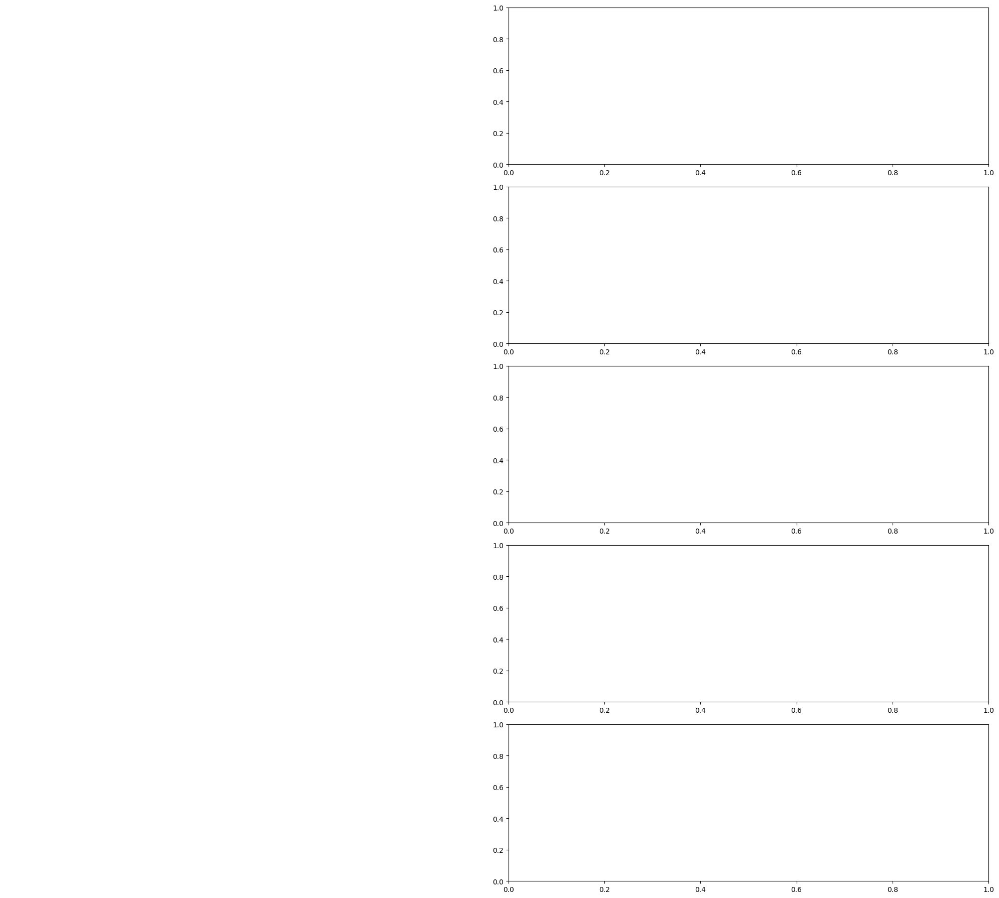

In [35]:

def convert_to_datetime(time_step, date_range):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 5
num_cols = 2


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 18))

index_3d = 0
for row in range(num_rows):
    for col in range(num_cols): 
        if index_3d >= len(nos_id_MSL):
           # If there are fewer stations than subplots, turn off unused subplots
           axs[row, col].axis('off')
           break
            
        if index_3d < len(nos_id_MSL):
            ax = axs[row, col]
            ax.plot(all_zeta_values_3d_MSL[index_3d], label='Nowcast (STOFS-3D-Atlantic)', color='blue')
            print(nos_id_MSL[index_3d])
            for i in range(0,len(nos_id_points)):
                if nos_id_points[i]== nos_id_MSL[index_3d]:
                   index_2d = i
                   break
            
            ax.plot(all_zeta_values[i, :], label='Nowcast (STOFS-2D-Global)', color='blue', linestyle='dashed')
            ax.plot(Observation[i][0], label='Observation', color='red')
            print(nos_id_points[i])
            ax.set_title(names[i])
            
            ax.set_xlabel('Date')
            
            # Set x ticks and labels
            ax.set_xticks(range(0, len(all_zeta_values[i, :]), 120))
            time_steps = range(0, len(all_zeta_values[i, :]))
            time_labels = [convert_to_datetime(step, date_range) for step in time_steps]
            selected_dates = time_labels[::120]
            ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
            
            ax.axvline(x=landfall_time_step*10, color='green', linestyle='--', linewidth=1)
            ax.text(landfall_time_step*10*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
            
            ax.set_ylabel('WL(m, MSL)')
            if row == 0 :
                ax.legend(loc='upper left')
        
        index_3d += 1


plt.tight_layout()
plt.savefig(f'nowcast_{Event_name}')  # Save the figure
plt.show()




# Read STOFS-2d-Global Forecast Data on the Fly 

In [36]:
# Read STOFS-2d-global

bucket_name = bucket_name_2d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)

# Find the forecast date
date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')
print(date)
# Find the Forecast cycle
date_H = int((start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%H'))

cycle = None
for num in cycles_2d:
    if int(num) < date_H:
        if cycle is None or int(num) > cycle:
            cycle = int(num)
cycle = f'{cycle:02}'

print(cycle)
base_key = f'stofs_2d_glo.{date}'
filename = f't{cycle}z.{STOFS_file_2d}.nc'
key = f'{base_key}/stofs_2d_glo.{filename}'
forecast_2d = read_netcdf_from_s3(bucket_name, key)

forecast_2d

20240909
18


<xarray.Dataset> Size: 25MB
Dimensions:       (time: 1860, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 15kB 2024-09-09T12:06:00 ... 2024-09-...
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 84kB ...
    x             (station) float64 14kB ...
    y             (station) float64 14kB ...
    zeta          (time, station) float64 25MB ...
Attributes: (12/50)
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    description:        2024090918 :-6 hr nowcast and +180 hr forecast ! 32 C...
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

# Read STOFS-3d-Atlantic Forecast Data on the Fly 

In [37]:
# Read STOFS-3d-Atlantic

bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)


# Find the forecast date
date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')
print(date)

base_key = f'stofs_3d_atl.{date}'
filename = 't12z.points.cwl.nc'
key = f'STOFS-3D-Atl/{base_key}/stofs_3d_atl.{filename}'
forecast_3d = read_netcdf_from_s3(bucket_name, key)

forecast_3d


20240909


<xarray.Dataset> Size: 5MB
Dimensions:       (time: 1200, station: 108)
Coordinates:
  * time          (time) datetime64[ns] 10kB 2024-09-08T12:06:00 ... 2024-09-...
Dimensions without coordinates: station
Data variables:
    zeta          (time, station) float64 1MB ...
    station_name  (station) |S50 5kB ...
    x             (station) float64 864B ...
    y             (station) float64 864B ...
    u             (time, station) float64 1MB ...
    v             (time, station) float64 1MB ...
    salinity      (time, station) float64 1MB ...
    temperature   (time, station) float64 1MB ...
Attributes:
    title:       SCHISM Model output
    source:      SCHISM model output version v10
    references:  http://ccrm.vims.edu/schismweb/
    history:     Mon Sep  9 18:04:50 2024: ncap2 -O -F -S /lfs/h1/ops/prod/pa...
    NCO:         netCDF Operators version 4.9.7 (Homepage = http://nco.sf.net...

In [38]:
start_date

datetime.datetime(2024, 9, 9, 0, 0)

In [39]:
date

'20240909'

# Collect Forecast data at CO-OPS stations in STOFS-2D-Global station list

In [40]:
# Create an empty list to collect zeta values
zeta_values_list = []
nos_id_points = []
x_values = []
y_values = []
names = []


# Loop over stations and extract zeta if any search string is found in the station name


    
for nos_id in station_id:
  

   for station_index in range(len(forecast_2d.station)):
        station_name = forecast_2d.station_name[station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           print(nos_id)
           zeta_values = forecast_2d.zeta[:, station_index]  # Extract zeta values for the current station
           x = forecast_2d.x[station_index]
           y = forecast_2d.y[station_index]
           # Save the availilbe stations in the station list
           nos_id_points.append(nos_id)
           zeta_values_list.append(zeta_values)
           x_values.append(x.item())
           y_values.append(y.item())
           names.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
forecast_all_zeta_values = np.concatenate(zeta_values_list, axis=0)

forecast_all_zeta_values = np.reshape(forecast_all_zeta_values, (int(len(forecast_all_zeta_values)/len(forecast_2d.time)),len(forecast_2d.time)))


8735180
8735391
8736897
8737048
8737138
8741533
8747437
8760721
8760922
8761305
8761724
8761927
8762075
8764044
8764227
8764314
8766072


# Collect Forecast data at CO-OPS stations in STOFS-3D_Atlantic station list

In [41]:
# Create an empty list to collect zeta values
zeta_values_list = []
nos_id_points_3d = []
x_values = []
y_values = []
names_3d = []


# Loop over stations and extract zeta if any search string is found in the station name

    
for nos_id in station_id:
    
    for station_index in range(len(forecast_3d.station)):
        station_name = forecast_3d.station_name[station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           print(nos_id)
           zeta_values = forecast_3d.zeta[:, station_index]  # Extract zeta values for the current station
           x = forecast_3d.x[station_index]
           y = forecast_3d.y[station_index]
           # Save the availilbe stations in the station list
           nos_id_points_3d.append(nos_id)
           zeta_values_list.append(zeta_values)
           x_values.append(x.item())
           y_values.append(y.item())
           names_3d.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
forecast_3d_all_zeta_values = np.concatenate(zeta_values_list, axis=0)

forecast_3d_all_zeta_values = np.reshape(forecast_3d_all_zeta_values, (int(len(forecast_3d_all_zeta_values)/len(forecast_3d.time)),len(forecast_3d.time)))


8735180
8736897
8737048
8737138
8741533
8747437
8761305
8761927
8764044
8764227
8766072


# Collect the observation data for STOFS-2D-Global

In [42]:

# Initialize an empty DataFrame to store the data
Observation_2d_forecast = []

# Loop over each nos_id
for nos_id in nos_id_points:
   
       # Retrieve water level information for the specified date range
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(forecast_2d.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(forecast_2d.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='MSL')
      

       # Add the data for the current station to the result DataFrame
       Observation_2d_forecast.append(station_df['value'].values)



# Collect the observation data for STOFS-3D-Atlantic

In [43]:

# Initialize an empty DataFrame to store the data
Observation_3d_forecast = []

# Loop over each nos_id
for nos_id in nos_id_points_3d:
   
       # Retrieve water level information for the specified date range
       station= searvey.coops.COOPS_Station(int(nos_id)) 
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(forecast_3d.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(forecast_3d.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='NAVD')
    
      

       # Add the data for the current station to the result DataFrame
       Observation_3d_forecast.append(station_df['value'].values)

# Plot Forecast for STOFS-2D-Global

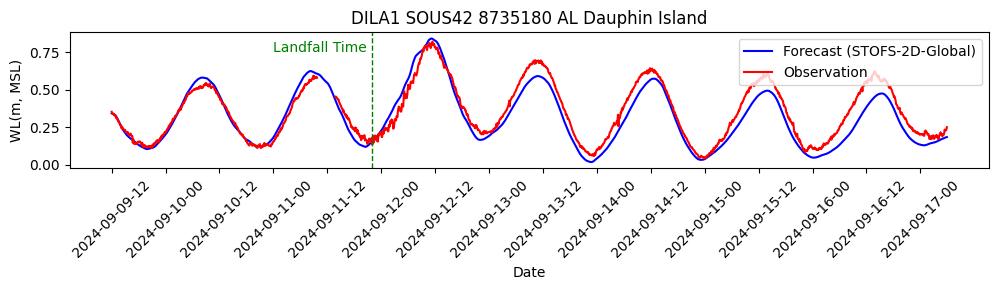

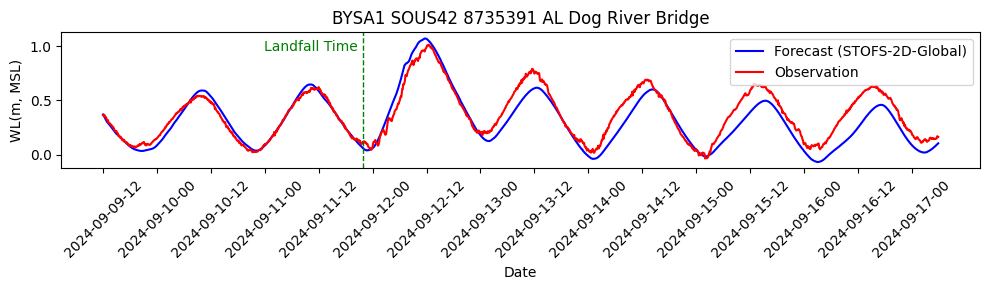

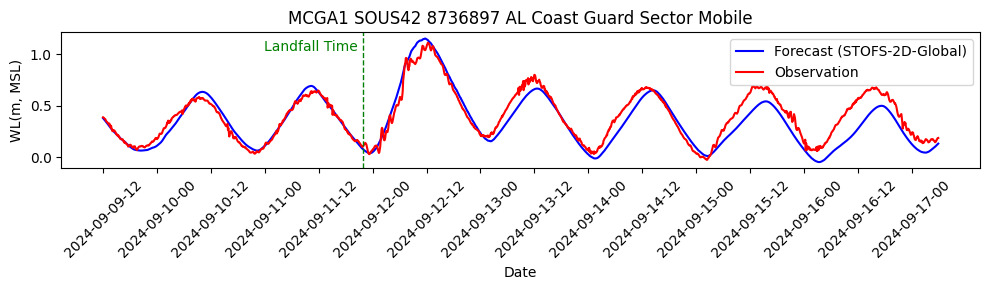

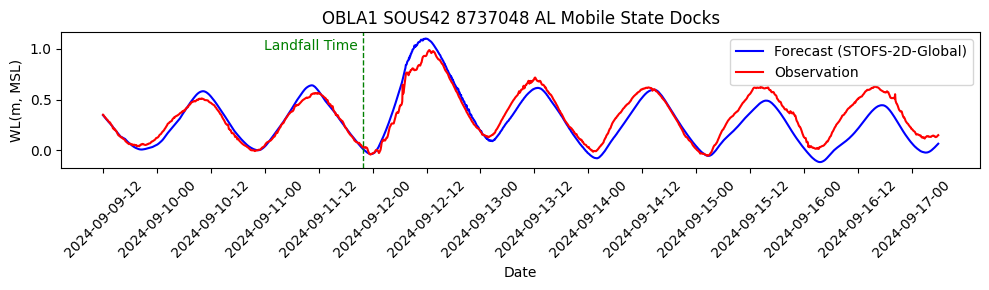

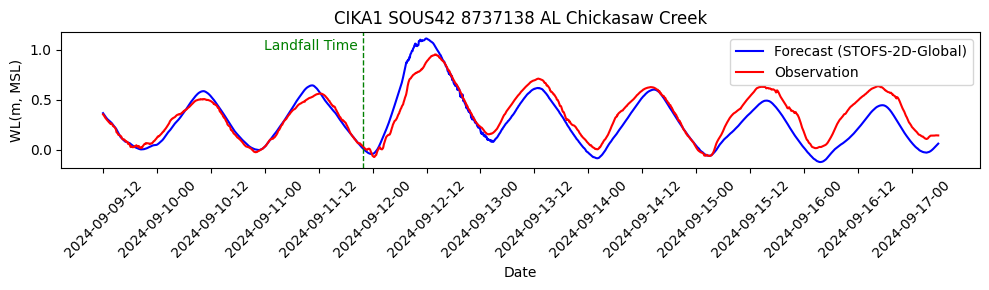

...

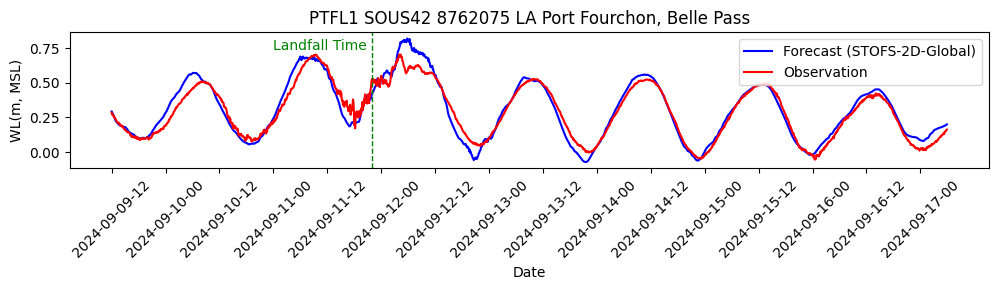

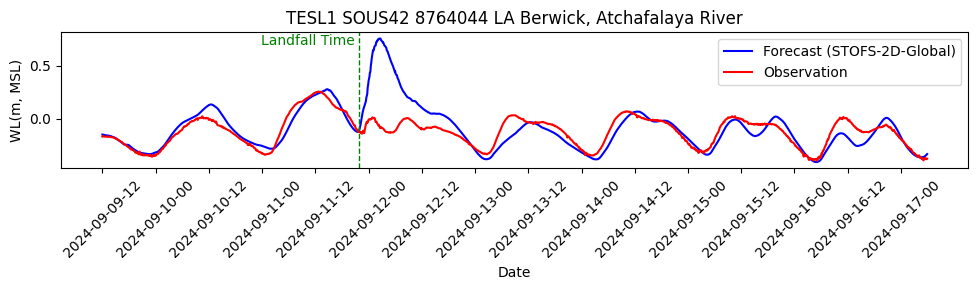

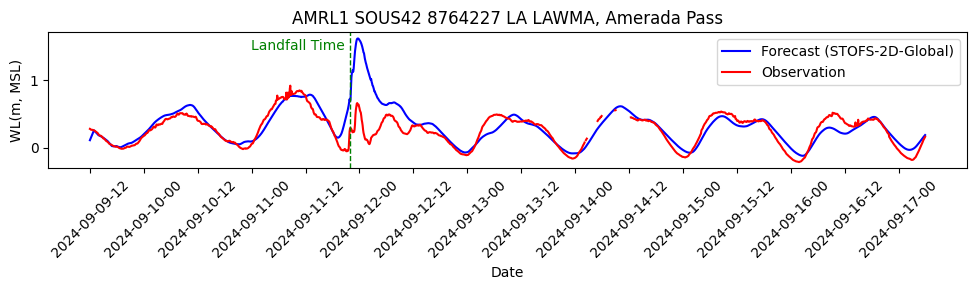

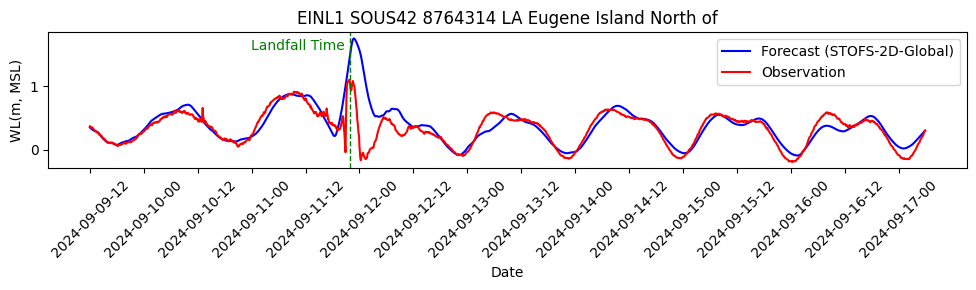

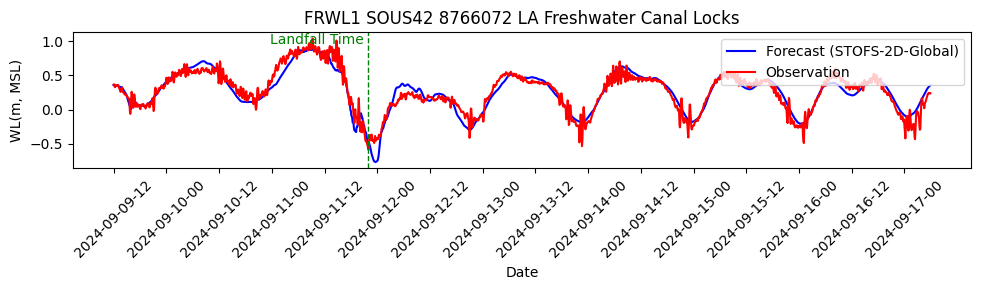

In [44]:
def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(forecast_2d.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(minutes=6)  
    return start_date + int(time_step) * time_delta



index = 0

for nos_id in nos_id_points:
    fig, ax = plt.subplots(figsize=(10, 3))
       
    ax.plot(forecast_all_zeta_values[index,:], label='Forecast (STOFS-2D-Global)', color='blue')
    ax.plot(Observation_2d_forecast[index], label='Observation', color='red')


    ax.set_title(names[index])
        
    ax.set_xlabel('Date')

   
    # Set x ticks and labels
    ax.set_xticks(range(0, len(forecast_all_zeta_values[index, :]), 120)) 
    time_steps = range(0, len(forecast_all_zeta_values[index, :]))
    time_labels = [convert_to_datetime(step) for step in time_steps]
    selected_dates = time_labels[::120]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)


    # Calculate the landfall time step
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    landfall_datetime = start_date + timedelta(hours=landfall_time_step)

    forecast_landfall_time_step = None 
    
    for step, time_label in zip(time_steps, time_labels): 

        if time_label.replace(tzinfo = None) == landfall_datetime:
            forecast_landfall_time_step = step 
            break   
    ax.axvline(x=forecast_landfall_time_step, color='green', linestyle='--', linewidth=1)
    ax.text(forecast_landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
    ax.set_ylabel('WL(m, MSL)')
    ax.legend(loc = 'upper right')
    plt.tight_layout()
    plt.show()
    index = index+1

# Create a figure for STOFS-2D-Global forecast data

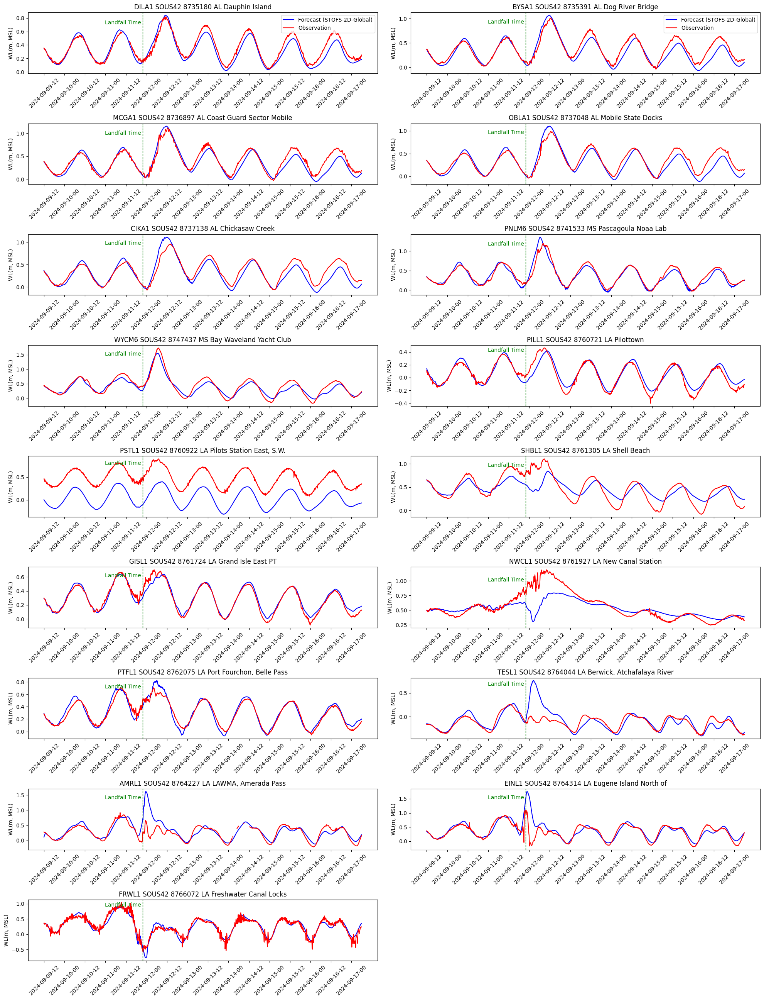

In [45]:


def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(forecast_2d.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta


fig, axs = plt.subplots(nrows=9, ncols=2, figsize=(20, 26))  # 4 rows, 2 columns


index = 0


for row in range(9):  
    for col in range(2):  
        if index >= len(nos_id_points):
           # If there are fewer stations than subplots, turn off unused subplots
           axs[row, col].axis('off')
           break
            
        if index < len(nos_id_points):
            ax = axs[row, col]
           
            ax.plot(forecast_all_zeta_values[index, :], label='Forecast (STOFS-2D-Global)', color='blue')
            ax.plot(Observation_2d_forecast[index], label='Observation', color='red')
            
            ax.set_title(names[index])

            ax.set_xticks(range(0, len(forecast_all_zeta_values[index, :]), 120)) 
            time_steps = range(0, len(forecast_all_zeta_values[index, :]))
            time_labels = [convert_to_datetime(step) for step in time_steps]
            
            # Calculate the landfall time step
            start_date = datetime.strptime(date_range[0], '%Y%m%d')
            landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
            forecast_2d_landfall_time_step = None 
            
            for step, time_label in zip(time_steps, time_labels): 
                if time_label.replace(tzinfo = None) == landfall_datetime:
                    forecast_2d_landfall_time_step = step 
                    break   
        

            selected_dates = time_labels[::120]
            ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        
            ax.axvline(x=forecast_2d_landfall_time_step, color='green', linestyle='--', linewidth=1)
            ax.text(forecast_2d_landfall_time_step*0.8, ax.get_ylim()[1]*0.8, 'Landfall Time', color='green', ha='center')
            
            ax.set_ylabel('WL(m, MSL)')
            if row == 0 :
                ax.legend(loc='upper right')
        
        index += 1


plt.tight_layout()
plt.savefig(f'Forecast_2d_{Event_name}')  # Save the figure
plt.show()



# Plot Forecast for STOFS-3D-Atlantic

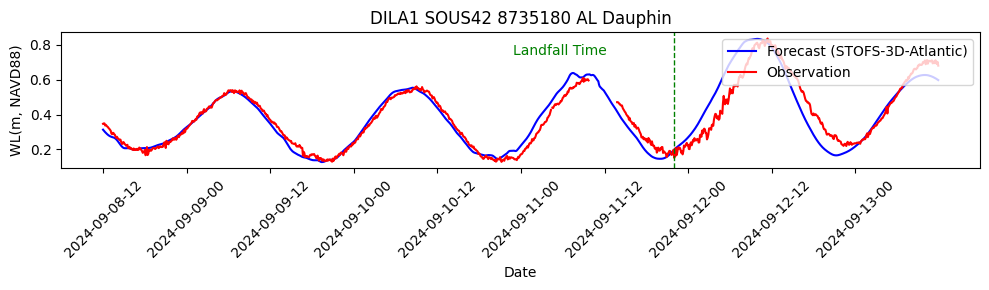

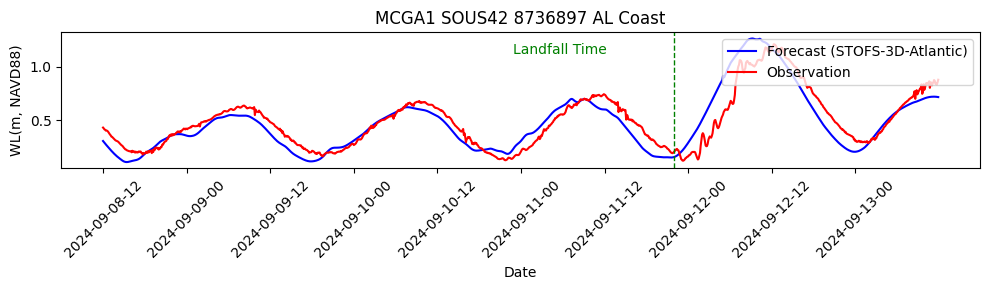

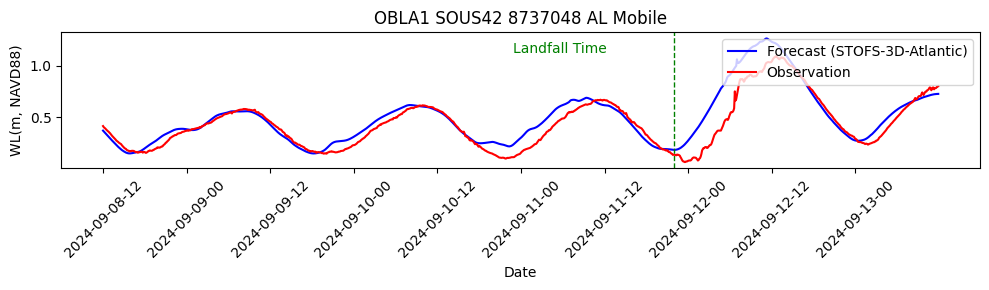

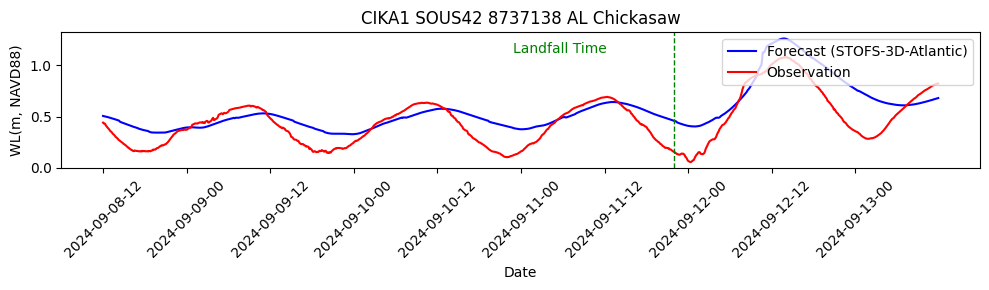

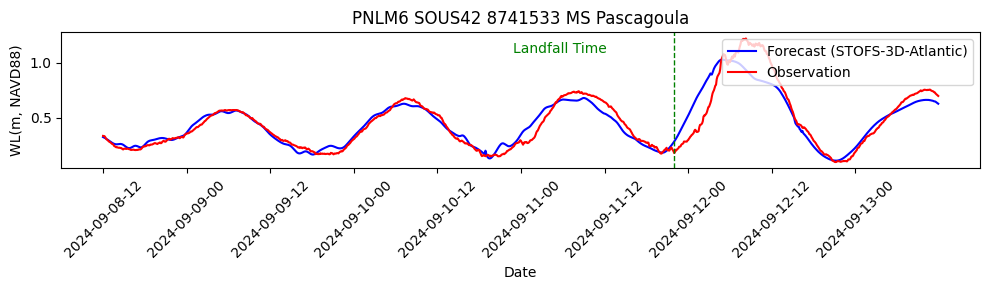

...

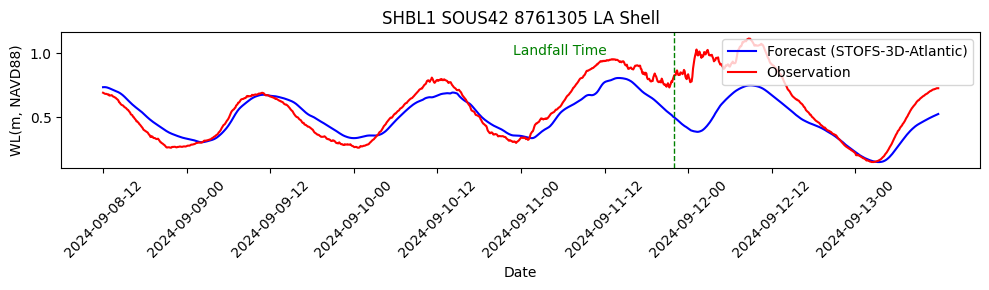

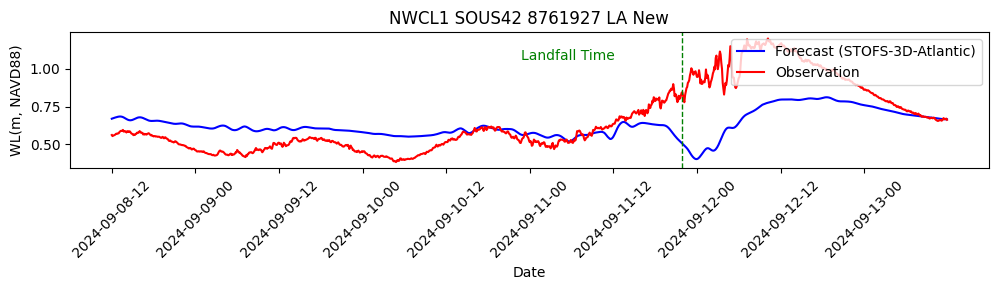

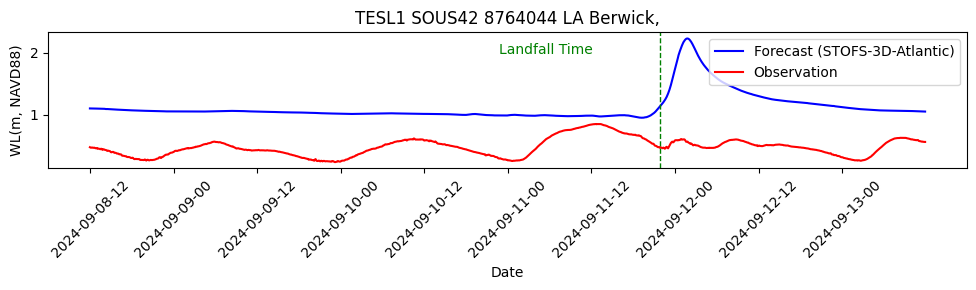

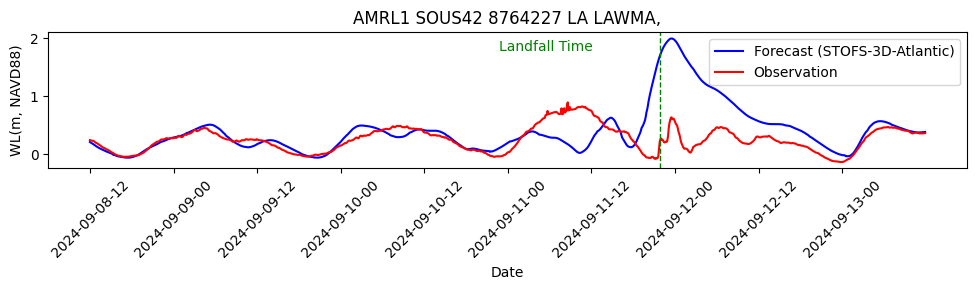

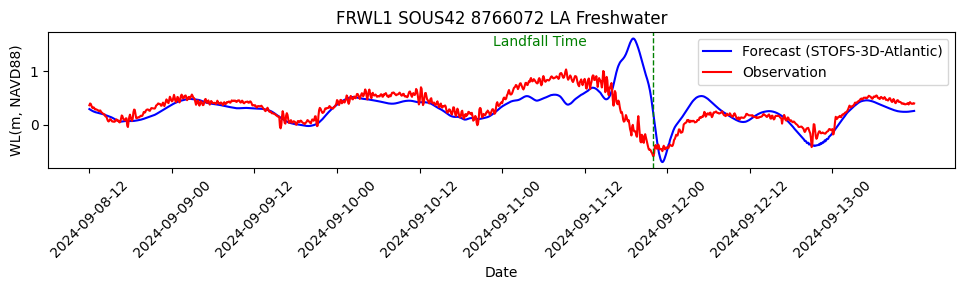

In [46]:
def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(forecast_3d.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(minutes=6)  
    return start_date + time_step * time_delta



index = 0

for nos_id in nos_id_points_3d:
    
    fig, ax = plt.subplots(figsize=(10, 3))
       
    ax.plot(forecast_3d_all_zeta_values[index,:], label='Forecast (STOFS-3D-Atlantic)', color='blue')
    ax.plot(Observation_3d_forecast[index], label='Observation', color='red')


    ax.set_title(names_3d[index])
        
    ax.set_xlabel('Date')

   
    # Set x ticks and labels
    ax.set_xticks(range(0, len(forecast_3d_all_zeta_values[index, :]), 120)) 
    time_steps = range(0, len(forecast_3d_all_zeta_values[index, :]))
    time_labels = [convert_to_datetime(step) for step in time_steps]

    selected_dates = time_labels[::120]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)


    # Calculate the landfall time step
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
    forecast_3d_landfall_time_step = None 
    
    for step, time_label in zip(time_steps, time_labels): 

        if time_label.replace(tzinfo = None) == landfall_datetime:
            forecast_3d_landfall_time_step = step 
            break   
            
    selected_dates = time_labels[::120]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        
            
    ax.axvline(x=forecast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
    ax.text(forecast_3d_landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
    ax.set_ylabel('WL(m, NAVD88)')
    ax.legend(loc = 'upper right')
    plt.tight_layout()
    plt.show()
    index = index+1

# Create a figure for STOFS-3D-Atlantic forecast data

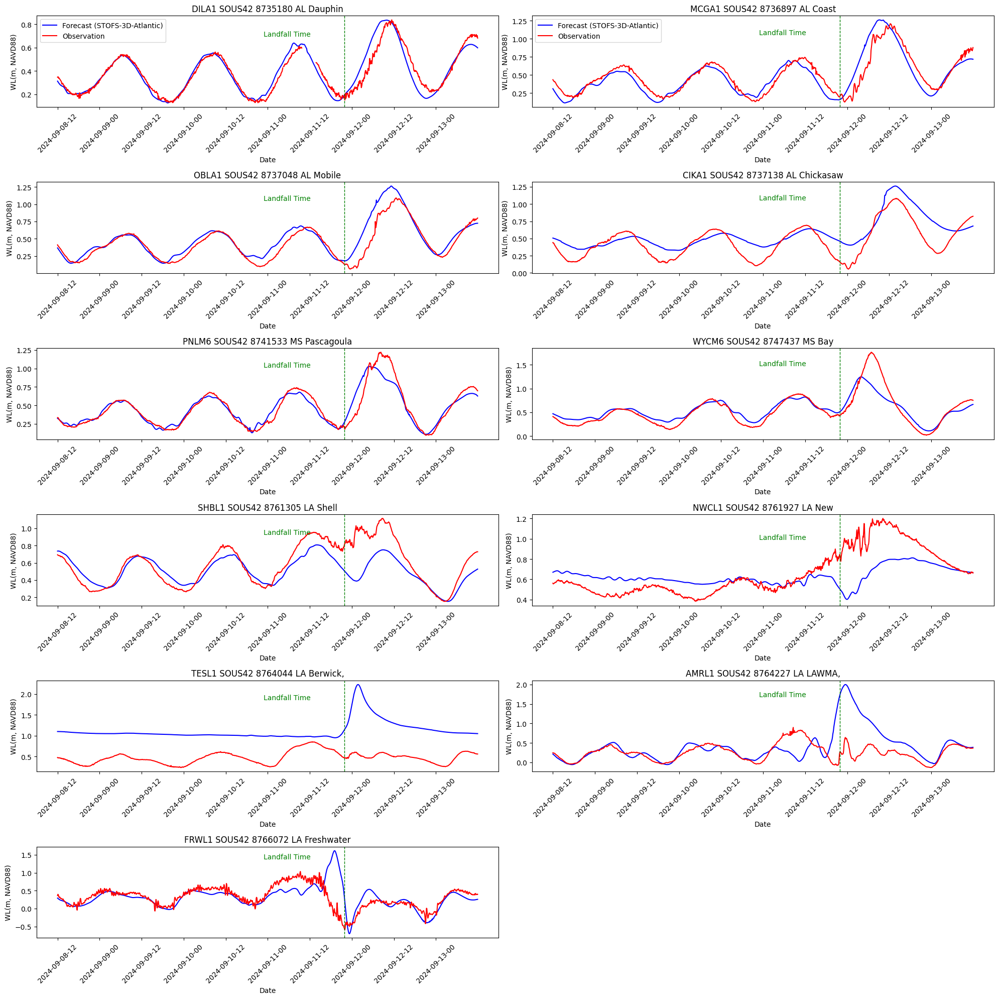

In [47]:

def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(forecast_3d.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta


fig, axs = plt.subplots(nrows=6, ncols=2, figsize=(20, 20))  # 4 rows, 2 columns


index = 0


for row in range(6):  
    for col in range(2):  
        if index >= len(nos_id_points_3d):
           # If there are fewer stations than subplots, turn off unused subplots
           axs[row, col].axis('off')
           break
            
        if index < len(nos_id_points_3d):
            ax = axs[row, col]
            ax.plot(forecast_3d_all_zeta_values[index, :], label='Forecast (STOFS-3D-Atlantic)', color='blue')

            ax.plot(Observation_3d_forecast[index], label='Observation', color='red')
            
            ax.set_title(names_3d[index])
            
            ax.set_xlabel('Date')
            
            # Set x ticks and labels
            ax.set_xticks(range(0, len(forecast_3d_all_zeta_values[index, :]), 120)) 
            time_steps = range(0, len(forecast_3d_all_zeta_values[index, :]))
            time_labels = [convert_to_datetime(step) for step in time_steps]
            
            # Calculate the landfall time step
            start_date = datetime.strptime(date_range[0], '%Y%m%d')
            landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
            forecast_3d_landfall_time_step = None 
            
            for step, time_label in zip(time_steps, time_labels): 
                if time_label.replace(tzinfo = None) == landfall_datetime:
                    forecast_3d_landfall_time_step = step 
                    break   
        
            selected_dates = time_labels[::120]
            ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
   
            ax.axvline(x=forecast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
            ax.text(forecast_3d_landfall_time_step*0.8, ax.get_ylim()[1]*0.8, 'Landfall Time', color='green', ha='center')
            
            ax.set_ylabel('WL(m, NAVD88)')
            if row == 0 :
                ax.legend(loc='upper left')
        
        index += 1


plt.tight_layout()
plt.savefig(f'forecast_3d_{Event_name}')  # Save the figure
plt.show()


# Find CO-OPS wind observational stations

In [48]:
if Region == 'NaN':
   bbox = storm_track.wind_swaths(wind_speed=34)[advisory][track_date]
else:
   bbox = shapely.box(Region[0], Region[2], Region[1], Region[3])

all_stations = get_coops_stations(metadata_source='main', region=bbox)
#wind_stations = all_stations[((all_stations.status == 'active') & (all_stations.station_type == 'met')) | (all_stations.status == 'active') & (all_stations.station_type == 'waterlevelsandmet') ]
wind_stations = all_stations[((all_stations.status == 'active') & (all_stations.station_type == 'met'))]

wind_stations = wind_stations.sort_values(by ='nos_id')
wind_stations = wind_stations.reset_index()


wind_stations

100%|███████████████████████████████████████████████████████████████████████████████████| 28/28 [00:09<00:00,  2.96it/s]


,nos_id,nws_id,station_type,name,state,lon,lat,removed,status,geometry
0,8734383,FRMA1,met,Fort Morgan,AL,-87.993614,30.234444,NaT,active,POINT (-87.99361 30.23444)
1,8734536,EFLA1,met,E Range Front Light Visibility,AL,-88.009598,30.440027,NaT,active,POINT (-88.00960 30.44003)
2,8735180,DILA1,met,Dauphin Island,AL,-88.074997,30.250278,NaT,active,POINT (-88.07500 30.25028)
3,8736163,MBPA1,met,"Middle Bay Port Visibility, Mobile Bay",AL,-88.086098,30.527193,NaT,active,POINT (-88.08610 30.52719)
4,8736897,MCGA1,met,Coast Guard Sector Mobile,AL,-88.058113,30.649500,NaT,active,POINT (-88.05811 30.64950)
5,8737005,PTOA1,met,Pinto Island Visibility,AL,-88.030998,30.671194,NaT,active,POINT (-88.03100 30.67119)
6,8737048,OBLA1,met,Mobile State Docks,AL,-88.039612,30.704611,NaT,active,POINT (-88.03961 30.70461)
7,8741003,PTBM6,met,"Petit Bois Island, Port of Pascagoula",MS,-88.500000,30.213333,NaT,active,POINT (-88.50000 30.21333)
8,8741533,PNLM6,met,Pascagoula NOAA Lab,MS,-88.563057,30.367779,NaT,active,POINT (-88.56306 30.36778)
9,8747437,WYCM6,met,Bay Waveland Yacht Club,MS,-89.325798,30.326342,NaT,active,POINT (-89.32580 30.32634)


# Read wind Observation data

In [49]:
station_id = '8726384'
station_wind = fetch_coops_station(
    station_id=station_id,
    start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
    end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
    product='wind',  interval='h'
)
station_wind

8726384: Encountered an error response for {'station_id': '8726384', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726384&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240909%2000%3A00&end_date=20240915%2000%3A00'), 'client': <httpx.Client object at 0x2afe508f2600>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe378be3f0>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8726384: No data. Creating a dummy dataframe


""
time


In [50]:
station_id = '8726384'
station_wind = fetch_coops_station(
    station_id=station_id,
    start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
    end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
    product='air_pressure',  interval='h'
)
station_wind

,value,flags
time,,
2024-09-09 00:00:00+00:00,1013.3,"0,0,0"
2024-09-09 01:00:00+00:00,1014.0,"0,0,0"
2024-09-09 02:00:00+00:00,1015.3,"0,0,0"
2024-09-09 03:00:00+00:00,1015.6,"0,0,0"
2024-09-09 04:00:00+00:00,1015.6,"0,0,0"
...,...,...
2024-09-14 20:00:00+00:00,1010.7,"0,0,0"
2024-09-14 21:00:00+00:00,1010.8,"0,0,0"
2024-09-14 22:00:00+00:00,1010.9,"0,0,0"


# Read GFS Nowcast on the Fly

In [51]:

# Initialize empty DataFrames to store wind and pressure data
u_wind_dfs = pd.DataFrame()
v_wind_dfs = pd.DataFrame()
surface_pressure_dfs = pd.DataFrame()


# Initialize list to store all time information 
all_times = []



# Loop over different files for different dates and hours
dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  
    current_date += timedelta(days=1)


for date in dates:
    print(date)
    for i, cycle in enumerate(cycles_2d): 

        print(cycle)
        for hour in range(0, 6, 1):  # Assuming we want to loop from 0 to 120 hours
            print(hour)
      
            if cycle == '00':
                current_date = datetime.strptime(date, '%Y%m%d') 
                current_date -= timedelta(days=1) # Go back one day 
                date_one_day_back = current_date.strftime('%Y%m%d')
                one_cycle_back = '18'

                # Define the filename and the location of the GRIB2 file
                key = f'gfs.{date_one_day_back}/{one_cycle_back}/atmos/gfs.t{one_cycle_back}z.sfluxgrbf{hour:03d}.grib2'
                url = f"s3://noaa-gfs-bdp-pds/{key}"
                time = datetime.strptime(date_one_day_back, '%Y%m%d') + timedelta(hours=int(one_cycle_back)) + timedelta(hours=hour) 

            else:
                previous_cycle = cycles_2d[i - 1] 
                cycle = previous_cycle 

                # Define the filename and the location of the GRIB2 file
                key = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{hour:03d}.grib2'
                url = f"s3://noaa-gfs-bdp-pds/{key}"
                time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(cycle)) + timedelta(hours=hour) 

            

            # Fetch the GRIB2 data from S3

            try: 
                s3 = s3fs.S3FileSystem(anon=True)
                with s3.open(url, 'rb') as f:
                   grib_data = f.read()
            except:
                break


            # Define the variable names of interest
            variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']


            # Initialize empty arrays to store data
            data_arrays = {var_name: [] for var_name in variable_names}


            # Save the GRIB2 data to a temporary file
            with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
                 tmp_file.write(grib_data)
                 tmp_file.seek(0)  # Reset file pointer to the beginning
                 # Read the GRIB2 data using pygrib from the temporary file
                 grbs = pygrib.open(tmp_file.name)


            # Iterate over each message in the GRIB2 file
            for grb in grbs:
                 # Check if the message corresponds to one of the variables of interest
                 
                 if grb['name'] in variable_names:
                    # Append data to the corresponding array
                    data_arrays[grb['name']].append(grb.values)


            # Close the GRIB2 file
            grbs.close()

            # Convert data arrays to xarray DataArrays
            pressure_data = xr.DataArray(np.array(data_arrays['Surface pressure']), name='surface_pressure')
            u_wind_data = xr.DataArray(np.array(data_arrays['10 metre U wind component']), name='u_wind')
            v_wind_data = xr.DataArray(np.array(data_arrays['10 metre V wind component']), name='v_wind')


            # Create an xarray Dataset
            ds = xr.Dataset(
            data_vars={
            'surface_pressure': pressure_data,
            'u_wind': u_wind_data,
            'v_wind': v_wind_data},
             coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,},
             attrs={
            'description': 'GRIB Data Example'})


            # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
            ds = ds.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
    
            # Initialize empty DataFrames to store wind and pressure data for this hour
            u_wind_df = pd.DataFrame()
            v_wind_df = pd.DataFrame()
            surface_pressure_df = pd.DataFrame()
    
            # Loop over the elements of station_ds['y'] and station_ds['x']
            for y_val, x_val, nos_id in zip(wind_stations['lat'], wind_stations['lon'], wind_stations['nos_id']):
                 # Adjust target_longitude to be in the range of 0 to 360
                 longitude_adjusted = float(x_val) + 360 if float(x_val) < 0 else float(x_val)


                 # Find the index of the nearest latitude and longitude in the dataset
                 lat_idx = np.where((np.abs(ds['latitude'][0:4718592:3072] - float(y_val))) == np.min(np.abs(ds['latitude'][0:4718592:3072] - float(y_val))))
                 lon_idx = np.where((np.abs(ds['longitude'][0:3072] - longitude_adjusted)) == np.min(np.abs(ds['longitude'][0:3072] - longitude_adjusted)))
                 

                 # Extract the forcing data using the index
                 u_wind_value = ds.u_wind[0, lat_idx[0][0], lon_idx[0][0]].values
                 v_wind_value = ds.v_wind[0, lat_idx[0][0], lon_idx[0][0]].values
                 surface_pressure_value = ds.surface_pressure[0, lat_idx[0][0], lon_idx[0][0]].values


                 # Append the values to the respective DataFrames as columns with NOS ids as column names
                 u_wind_df[int(nos_id)] = [np.round(u_wind_value, 2)]
                 v_wind_df[int(nos_id)]= [np.round(v_wind_value, 2)]
                 surface_pressure_df[int(nos_id)] = [np.round(surface_pressure_value, 2)]


            u_wind_dfs = pd.concat([u_wind_dfs, u_wind_df], ignore_index=True)
            v_wind_dfs = pd.concat([v_wind_dfs, v_wind_df], ignore_index=True)
            surface_pressure_dfs = pd.concat([surface_pressure_dfs, surface_pressure_df], ignore_index=True)
            
            # Store the time information 
            all_times.append(time) 
            
            
            


20240909
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5
20240910
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5
20240911
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5
20240912
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5
20240913
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5
20240914
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5
20240915
00
0
1
2
3
4
5
06
0
1
2
3
4
5
12
0
1
2
3
4
5
18
0
1
2
3
4
5


In [54]:
# Convert all_times list to DataFrame 
time_df = pd.DataFrame({'Time': all_times}) # Print or use time_df as needed print(time_df)

time_df


,Time
0,2024-09-08 18:00:00
1,2024-09-08 19:00:00
2,2024-09-08 20:00:00
3,2024-09-08 21:00:00
4,2024-09-08 22:00:00
...,...
163,2024-09-15 13:00:00
164,2024-09-15 14:00:00
165,2024-09-15 15:00:00
166,2024-09-15 16:00:00


In [55]:
surface_pressure_dfs

,8734383,8734536,8735180,8736163,8736897,8737005,8737048,8741003,8741533,8747437,...,8761305,8761724,8761927,8761955,8762075,8762482,8764044,8764227,8764314,8766072
0,101379.24,101366.44,101379.24,101182.44,101214.44,101214.44,101129.64,101388.84,101304.04,101371.24,...,101355.24,101304.04,101390.44,101336.04,101278.44,101339.24,101323.24,101337.64,101340.84,101385.64
1,101308.86,101291.26,101308.86,101107.26,101137.66,101137.66,101065.66,101313.66,101212.86,101289.66,...,101315.26,101256.06,101347.26,101299.26,101243.26,101292.86,101256.06,101270.46,101273.66,101324.86
2,101221.46,101195.86,101218.26,101011.86,101051.86,101051.86,100986.26,101224.66,101115.86,101205.46,...,101229.46,101189.46,101248.66,101202.26,101168.66,101203.86,101183.06,101202.26,101203.86,101248.66
3,101174.35,101150.35,101171.15,100959.95,101014.35,101014.35,100937.55,101180.75,101087.95,101153.55,...,101172.75,101135.95,101185.55,101137.55,101110.35,101155.15,101126.35,101137.55,101132.75,101175.95
4,101171.14,101142.34,101164.74,100963.14,101015.94,101015.94,100923.14,101163.14,101086.34,101135.94,...,101139.14,101140.74,101153.54,101095.94,101127.94,101115.14,101103.94,101134.34,101132.74,101163.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,101177.59,101171.19,101167.99,100998.39,101060.79,101060.79,100980.79,101145.59,101071.99,101108.79,...,101135.99,101214.39,101147.19,101124.79,101219.19,101147.19,101132.79,101190.39,101209.59,101207.99
164,101196.86,101182.46,101184.06,101003.26,101072.06,101072.06,100988.86,101164.86,101075.26,101124.86,...,101169.66,101227.26,101219.26,101140.86,101246.46,101168.06,101155.26,101216.06,101240.06,101232.06
165,101227.08,101217.48,101211.08,101036.68,101105.48,101105.48,101017.48,101193.48,101119.88,101124.68,...,101201.48,101254.28,101249.48,101179.08,101267.08,101203.08,101174.28,101228.68,101243.08,101257.48
166,101204.84,101190.44,101190.44,101012.84,101080.04,101080.04,101000.04,101177.64,101110.44,101132.84,...,101204.84,101241.64,101264.04,101179.24,101248.04,101190.44,101187.24,101244.84,101257.64,101256.04


# Read Observation data for GFS

In [56]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_Nowcast= []
pressure_Observation_2d_Nowcast= []
# Loop over each nos_id
for nos_id in wind_stations['nos_id']:
      
       try:
          # Retrieve wind information for the specified date range
          station_wind = fetch_coops_station(
          station_id=nos_id,
          start_date=time_df['Time'][0],
          end_date=time_df['Time'][len(time_df)-1],
          product='wind',  interval='h')
          # Add the data for the current station to the result DataFrame
          #station_wind = station_wind.reset_index()
          Wind_Observation_2d_Nowcast.append(station_wind['speed'])

          station_pressure = fetch_coops_station(
          station_id=nos_id,
          start_date=time_df['Time'][0],
          end_date=time_df['Time'][len(time_df)-1],
          product='air_pressure',  interval='h')
          # Add the data for the current station to the result DataFrame
          #station_wind = station_wind.reset_index()
          pressure_Observation_2d_Nowcast.append(station_pressure['value'])

    
       except: 

          print(f'{nos_id} has no wind data')
     
    
Wind_Observation_2d_Nowcast

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8734536: Encountered an error response for {'station_id': '8734536', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8734536&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36fcc680>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe50144f80>, 'product': <COOPS_Product.WIND: 'wind'>, 'redire

8734536 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8736163: Encountered an error response for {'station_id': '8736163', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8736163&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36f92d20>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe36f93350>, 'product': <COOPS_Product.WIND: 'wind'>, 'redire

8736163 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8737005: Encountered an error response for {'station_id': '8737005', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8737005&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36fd5520>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe36f93980>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8737005: No data. Creating a dummy dataframe
/lustre/

8737005 has no wind data
8737048 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8741533: Encountered an error response for {'station_id': '8741533', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8741533&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36f93980>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afdf7f46990>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8741533: No data. Creating a dummy dataframe


8741533 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

8761955 has no wind data
8762075 has no wind data
8762482 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
 2024-09-08 18:00:00+00:00    4.3
 2024-09-08 19:00:00+00:00    4.0
 2024-09-08 20:00:00+00:00    3.8
 2024-09-08 21:00:00+00:00    4.7
 2024-09-08 22:00:00+00:00    4.2
                             ... 
 2024-09-15 13:00:00+00:00    3.5
 2024-09-15 14:00:00+00:00    3.4
 2024-09-15 15:00:00+00:00    3.6
 2024-09-15 16:00:00+00:00    2.9
 2024-09-15 17:00:00+00:00    3.0
 Name: speed, Length: 168, dtype: float64,
 time
 2024-09-08 18:00:00+00:00    5.0
 2024-09-08 19:00:00+00:00    4.3
 2024-09-08 20:00:00+00:00    4.2
 2024-09-08 21:00:00+00:00    4.2
 2024-09-08 22:00:00+00:00    3.0
                             ... 
 2024-09-15 13:00:00+00:00    3.7
 2024-09-15 14:00:00+00:00    6.1
 2024-09-15 15:00:00+00:00    2.8
 2024-09-15 16:00:00+00:00    3.4
 2024-09-15 17:00:00+00:00    2.7
 Name: speed, Length: 168, dtype: float64,
 time
 2024-09-08 18:00:00+00:00    3.0
 2024-09-08 19:00:00+00:00    2.3
 2024-09-08 20:00:00+00:00    4.2
 2024-09-08 21:00:00+00:00    1.9
 2024-09-08 

In [57]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_Nowcast = []
pressure_Observation_2d_Nowcast = []
valid_nos_ids = list(wind_stations['nos_id'])  # List of all nos_ids

# Loop over each nos_id
for nos_id in valid_nos_ids.copy():  # Use a copy of the list to avoid modifying it while iterating
    try:
        # Retrieve wind information for the specified date range
        station_wind = fetch_coops_station(
            station_id=nos_id,
            start_date=time_df['Time'][0],
            end_date=time_df['Time'].iloc[-1],  # Use iloc[-1] to get the last element
            product='wind',  
            interval='h'
        )
        # Add the data for the current station to the result DataFrame
        Wind_Observation_2d_Nowcast.append(station_wind['speed'])
        station_pressure = fetch_coops_station(
            station_id=nos_id,
            start_date=time_df['Time'][0],
            end_date=time_df['Time'].iloc[-1],  # Use iloc[-1] to get the last element
            product='air_pressure',  
            interval='h'
        )
        # Add the data for the current station to the result DataFrame
        pressure_Observation_2d_Nowcast.append(station_pressure['value'])
    except Exception as e:  # Catch the specific exception and print the error message
        print(f'{nos_id} has no wind data. Error: {e}')
        valid_nos_ids.remove(nos_id)  # Remove the nos_id from the list if an exception occurs

# Create a new DataFrame with the valid nos_ids
filtered_wind_stations = wind_stations[wind_stations['nos_id'].isin(valid_nos_ids)]

# Output or further process the results
print(Wind_Observation_2d_Nowcast)
print(pressure_Observation_2d_Nowcast)
print(filtered_wind_stations)



/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8734536: Encountered an error response for {'station_id': '8734536', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8734536&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe50b93440>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe50b936b0>, 'product': <COOPS_Product.WIND: 'wind'>, 'redire

8734536 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8736163: Encountered an error response for {'station_id': '8736163', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8736163&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe3714e7e0>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe3714d730>, 'product': <COOPS_Product.WIND: 'wind'>, 'redire

8736163 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8737005: Encountered an error response for {'station_id': '8737005', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8737005&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36f92390>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe36fcc590>, 'product': <COOPS_Product.WIND: 'wind'>, 'redire

8737005 has no wind data. Error: 'speed'
8737048 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8741533: Encountered an error response for {'station_id': '8741533', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8741533&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36fcd010>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe50b91a00>, 'product': <COOPS_Product.WIND: 'wind'>, 'redire

8741533 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

8761955 has no wind data. Error: 'speed'
8762075 has no wind data. Error: 'speed'


8762482: Encountered an error response for {'station_id': '8762482', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8762482&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240908%2018%3A00&end_date=20240915%2017%3A00'), 'client': <httpx.Client object at 0x2afe36f914f0>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2afe36f93a40>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8762482: No data. Creating a dummy dataframe
/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8762482 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
2024-09-08 18:00:00+00:00    4.3
2024-09-08 19:00:00+00:00    4.0
2024-09-08 20:00:00+00:00    3.8
2024-09-08 21:00:00+00:00    4.7
2024-09-08 22:00:00+00:00    4.2
                            ... 
2024-09-15 13:00:00+00:00    3.5
2024-09-15 14:00:00+00:00    3.4
2024-09-15 15:00:00+00:00    3.6
2024-09-15 16:00:00+00:00    2.9
2024-09-15 17:00:00+00:00    3.0
Name: speed, Length: 168, dtype: float64, time
2024-09-08 18:00:00+00:00    5.0
2024-09-08 19:00:00+00:00    4.3
2024-09-08 20:00:00+00:00    4.2
2024-09-08 21:00:00+00:00    4.2
2024-09-08 22:00:00+00:00    3.0
                            ... 
2024-09-15 13:00:00+00:00    3.7
2024-09-15 14:00:00+00:00    6.1
2024-09-15 15:00:00+00:00    2.8
2024-09-15 16:00:00+00:00    3.4
2024-09-15 17:00:00+00:00    2.7
Name: speed, Length: 168, dtype: float64, time
2024-09-08 18:00:00+00:00    3.0
2024-09-08 19:00:00+00:00    2.3
2024-09-08 20:00:00+00:00    4.2
2024-09-08 21:00:00+00:00    1.9
2024-09-08 22:00:00+00:00    2.5
         

In [58]:
filtered_wind_stations

,nos_id,nws_id,station_type,name,state,lon,lat,removed,status,geometry
0,8734383,FRMA1,met,Fort Morgan,AL,-87.993614,30.234444,NaT,active,POINT (-87.99361 30.23444)
2,8735180,DILA1,met,Dauphin Island,AL,-88.074997,30.250278,NaT,active,POINT (-88.07500 30.25028)
4,8736897,MCGA1,met,Coast Guard Sector Mobile,AL,-88.058113,30.649500,NaT,active,POINT (-88.05811 30.64950)
7,8741003,PTBM6,met,"Petit Bois Island, Port of Pascagoula",MS,-88.500000,30.213333,NaT,active,POINT (-88.50000 30.21333)
9,8747437,WYCM6,met,Bay Waveland Yacht Club,MS,-89.325798,30.326342,NaT,active,POINT (-89.32580 30.32634)
10,8760721,PILL1,met,Pilottown,LA,-89.258835,29.179306,NaT,active,POINT (-89.25883 29.17931)
11,8760922,PSTL1,met,"Pilots Station East, S.W. Pass",LA,-89.407501,28.932222,NaT,active,POINT (-89.40750 28.93222)
12,8761305,SHBL1,met,Shell Beach,LA,-89.672997,29.868299,NaT,active,POINT (-89.67300 29.86830)
13,8761724,GISL1,met,Grand Isle,LA,-89.956665,29.263332,NaT,active,POINT (-89.95667 29.26333)
14,8761927,NWCL1,met,New Canal Station,LA,-90.113335,30.027222,NaT,active,POINT (-90.11333 30.02722)


# Plot Nowcast wind 

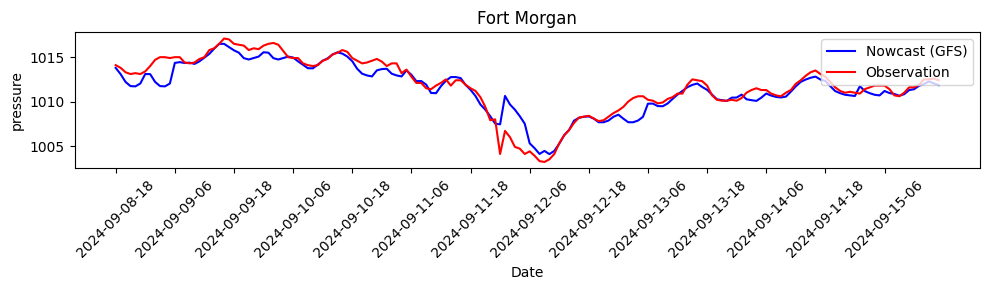

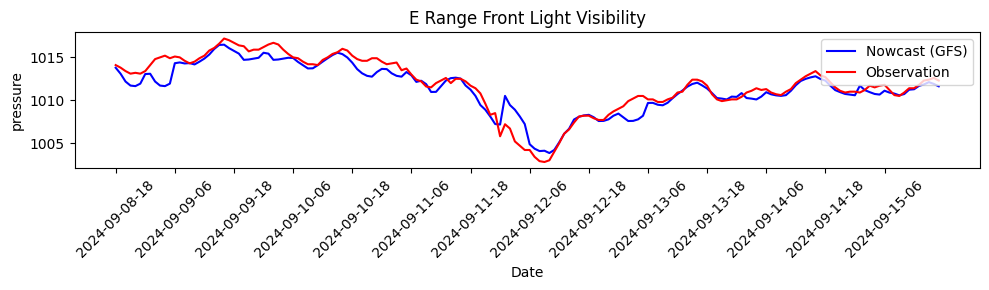

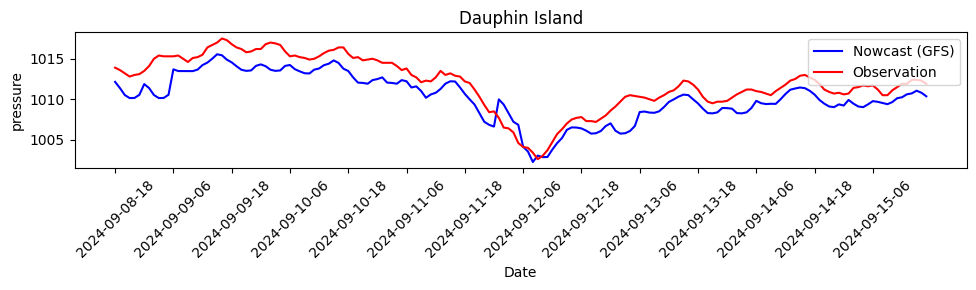

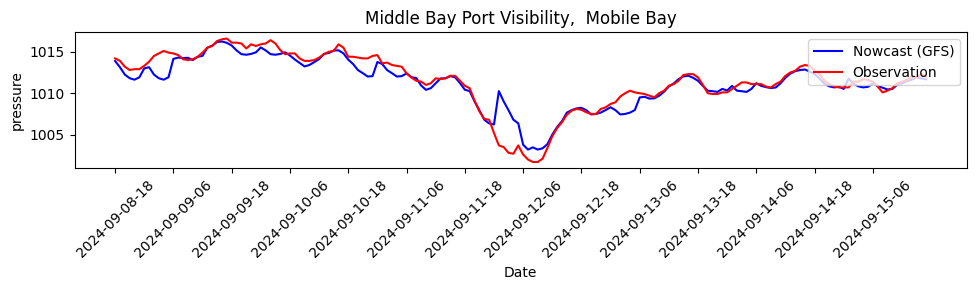

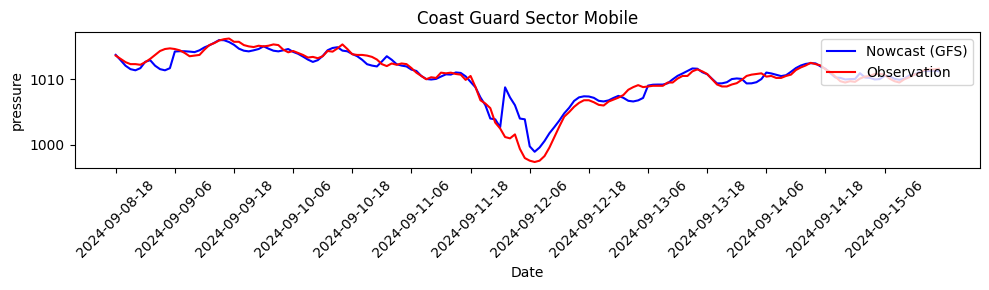

...

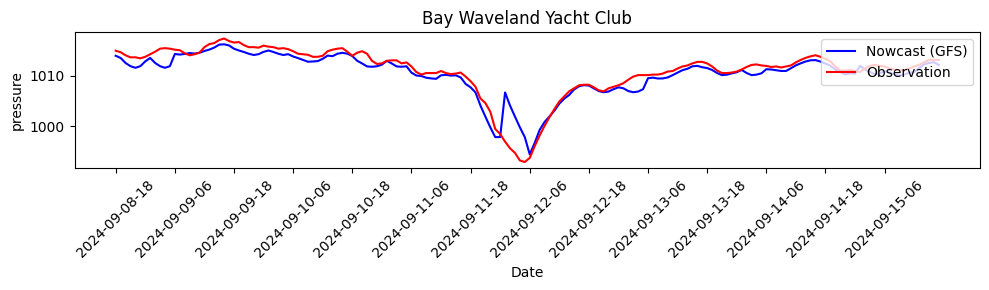

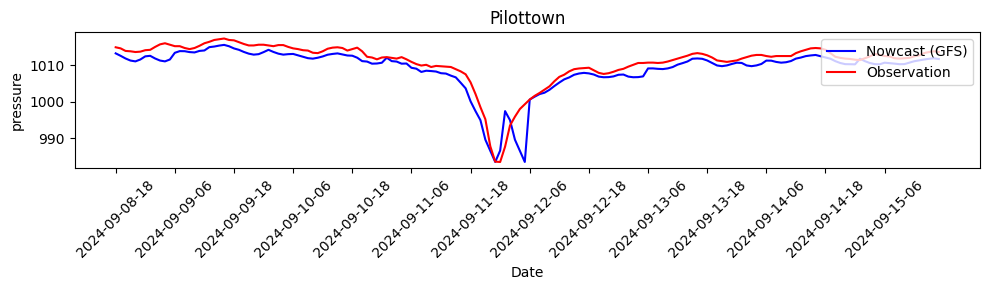

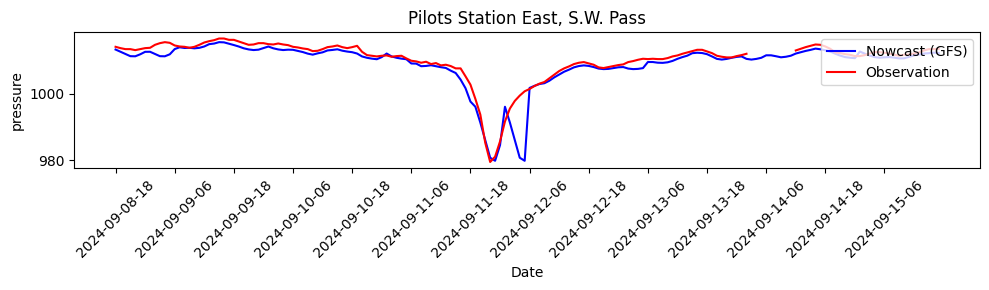

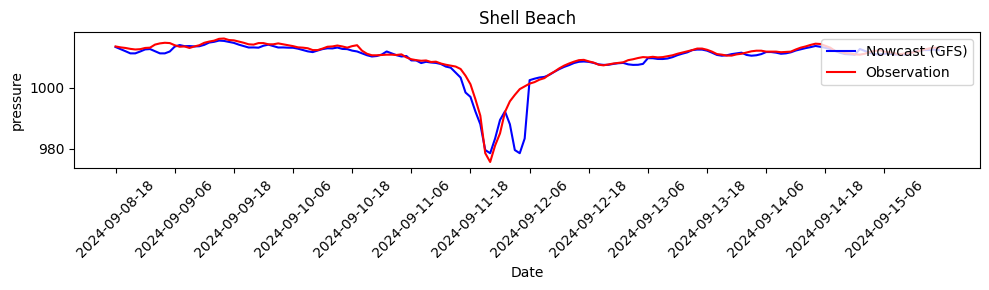

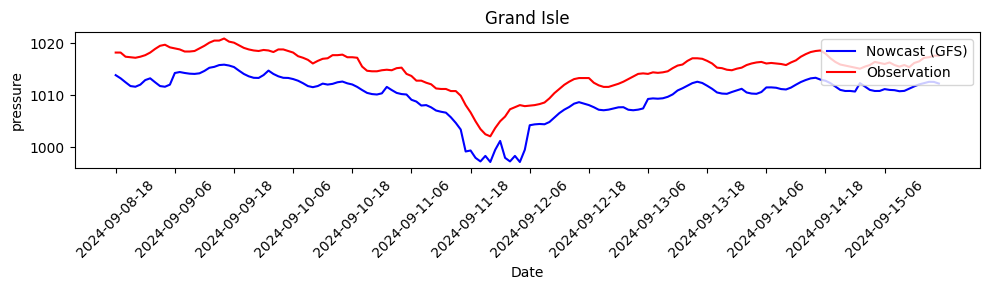

In [59]:
def convert_to_datetime(time_step):
    start_date = time_df['Time'][0]
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


index = 0

for nos_id in filtered_wind_stations['nos_id']:
    
    fig, ax = plt.subplots(figsize=(10, 3))
       
    ax.plot(surface_pressure_dfs[int(nos_id)][:len(pressure_Observation_2d_Nowcast[0])]/100, label='Nowcast (GFS)', color='blue')
    ax.plot(pressure_Observation_2d_Nowcast[index].values, label='Observation', color='red')


    ax.set_title(wind_stations['name'][index])
        
    ax.set_xlabel('Date')

   
    # Set x ticks and labels
    ax.set_xticks(range(0, len(pressure_Observation_2d_Nowcast[0]), 12)) 
    time_steps = range(0, len(pressure_Observation_2d_Nowcast[0]))
    time_labels = [convert_to_datetime(step) for step in time_steps]

    selected_dates = time_labels[::12]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)

    #ax.axvline(x=landfall_time_step+6, color='green', linestyle='--', linewidth=1) # Add 6 because of 
    #ax.text(landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
    ax.set_ylabel('pressure')
    ax.legend(loc = 'upper right')
    plt.tight_layout()
    plt.show()
    index = index+1

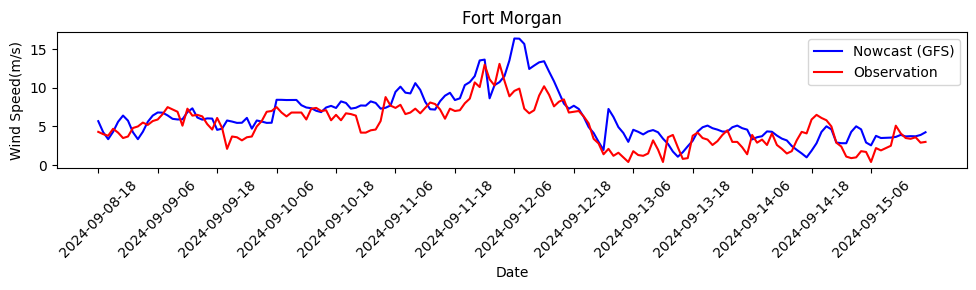

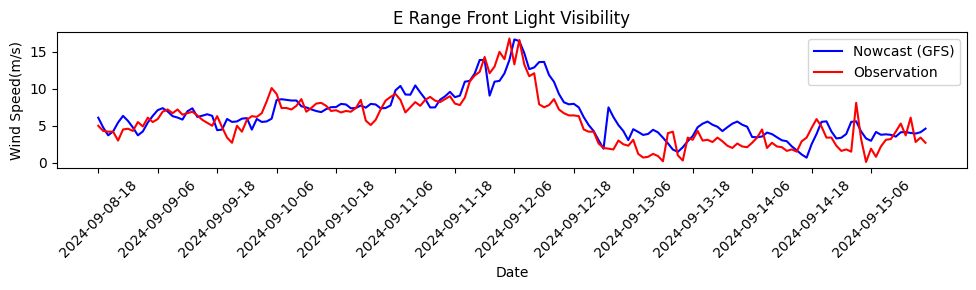

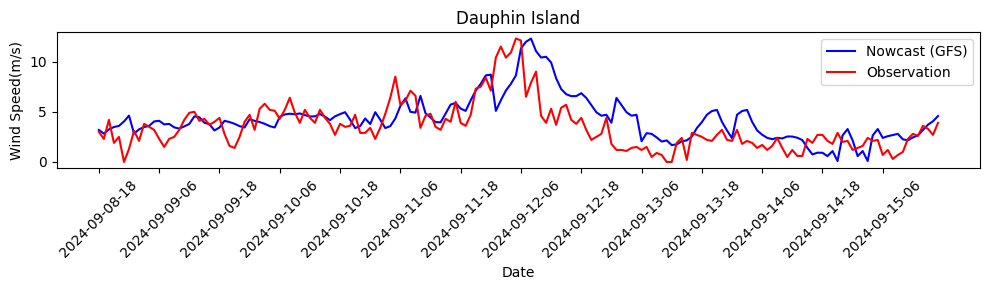

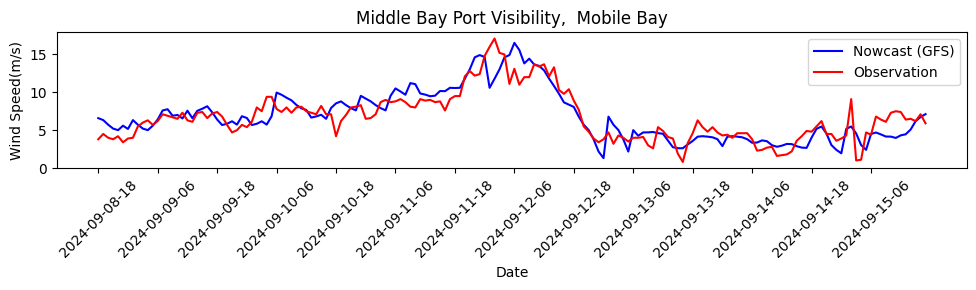

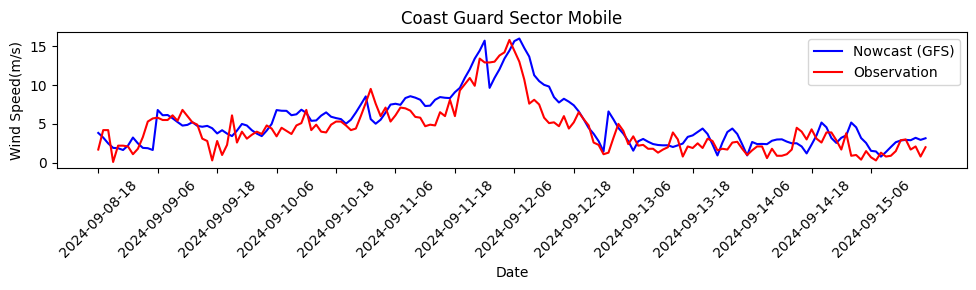

...

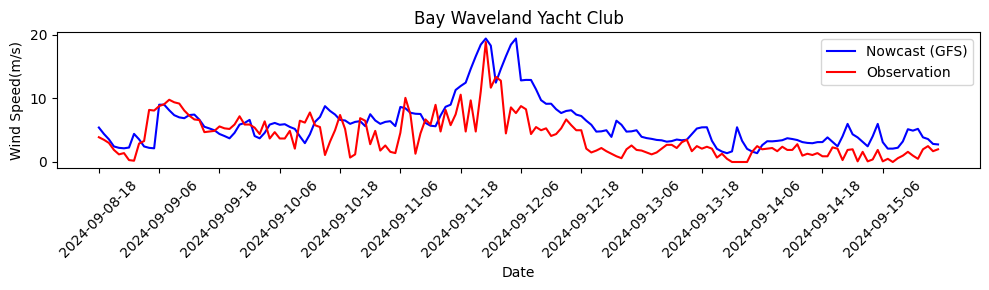

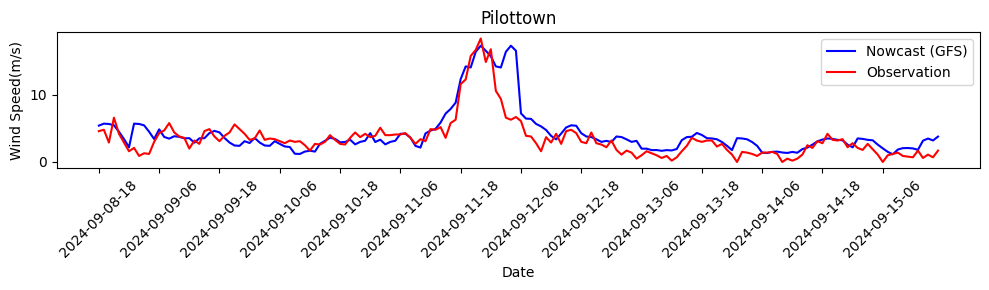

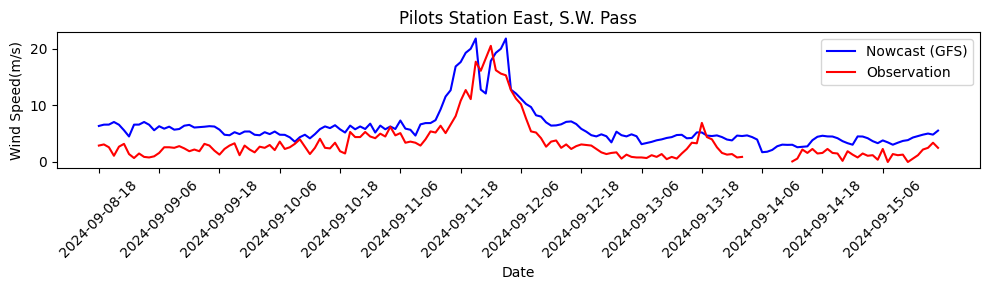

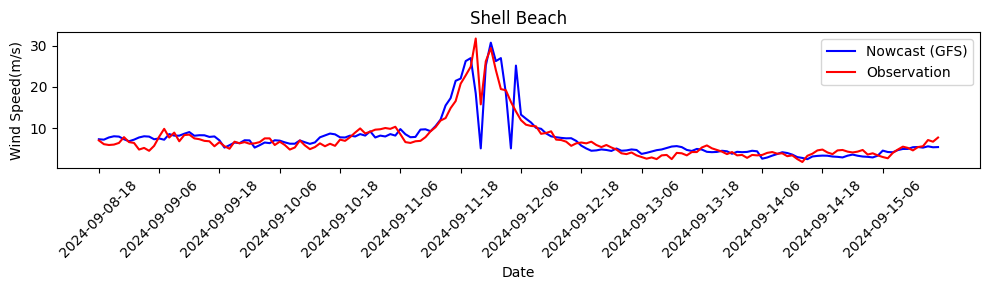

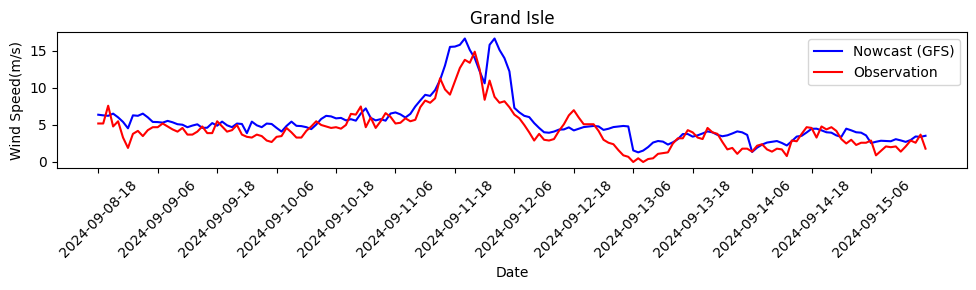

In [60]:
def convert_to_datetime(time_step):
    start_date = time_df['Time'][0]
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


index = 0

for nos_id in filtered_wind_stations['nos_id']:
    
    fig, ax = plt.subplots(figsize=(10, 3))
       
    ax.plot(np.sqrt(v_wind_dfs[int(nos_id)]**2 + u_wind_dfs[int(nos_id)]**2)[:len(Wind_Observation_2d_Nowcast[0])], label='Nowcast (GFS)', color='blue')
    ax.plot(Wind_Observation_2d_Nowcast[index].values, label='Observation', color='red')


    ax.set_title(wind_stations['name'][index])
        
    ax.set_xlabel('Date')

   
    # Set x ticks and labels
    ax.set_xticks(range(0, len(pressure_Observation_2d_Nowcast[0]), 12)) 
    time_steps = range(0, len(pressure_Observation_2d_Nowcast[0]))
    time_labels = [convert_to_datetime(step) for step in time_steps]

    selected_dates = time_labels[::12]
    ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)

    #ax.axvline(x=landfall_time_step+6, color='green', linestyle='--', linewidth=1) # Add 6 because of 
    #ax.text(landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
    ax.set_ylabel('Wind Speed(m/s)')
    ax.legend(loc = 'upper right')
    plt.tight_layout()
    plt.show()
    index = index+1

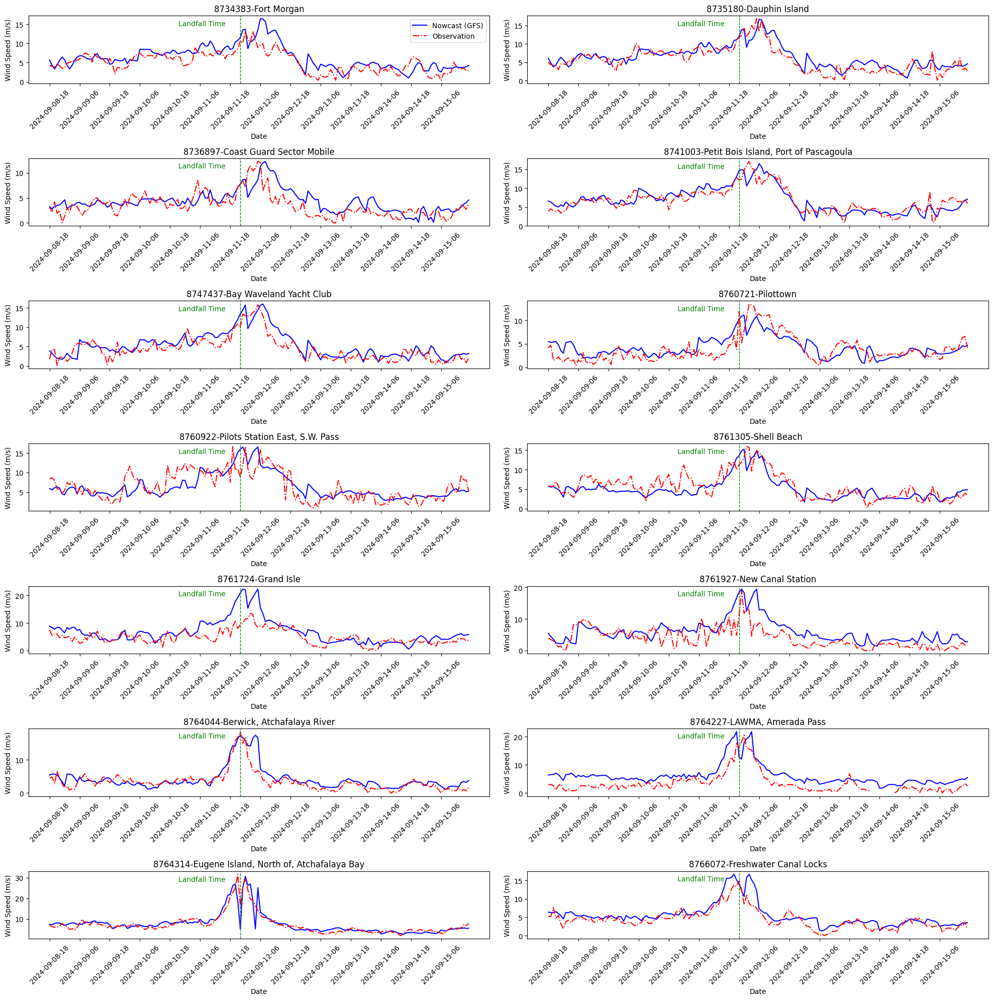

In [61]:



import matplotlib.pyplot as plt
import numpy as np
from datetime import timedelta

def convert_to_datetime(time_step):
    start_date = time_df['Time'][0]
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 7
num_cols = 2

# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20))

index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations):
            # If there are fewer stations than subplots, turn off unused subplots
            axs[row, col].axis('off')
            break
            
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        # Plot data
        ax.plot(np.sqrt(v_wind_dfs[int(nos_id)]**2 + u_wind_dfs[int(nos_id)]**2)[:len(Wind_Observation_2d_Nowcast[0])], label='Nowcast (GFS)', color='blue')
        ax.plot(Wind_Observation_2d_Nowcast[index].values, label='Observation', color='red', linestyle='dashdot')

        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')
        
        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_2d_Nowcast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_2d_Nowcast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]
        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)


        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        nowcast_wind_2d_landfall_time_step = None 
            
        for step, time_label in zip(time_steps, time_labels): 
                if time_label.replace(tzinfo = None) == landfall_datetime:
                    nowcast_wind_2d_landfall_time_step = step 
                    break


        
        ax.axvline(x=nowcast_wind_2d_landfall_time_step , color='green', linestyle='--', linewidth=1)
        ax.text(nowcast_wind_2d_landfall_time_step * 0.8, ax.get_ylim()[1] * 0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0 and col == 0:  # Place the legend in the top-left subplot to avoid overlapping
            ax.legend(loc='upper right')
        index += 1
            
          
# Adjust layout
plt.tight_layout()

# Save the figure
plt.savefig('GFS_Wind_nowcast.png')

# Display the plot
plt.show()



In [62]:
filtered_wind_stations['nos_id']

0     8734383
2     8735180
4     8736897
7     8741003
9     8747437
10    8760721
11    8760922
12    8761305
13    8761724
14    8761927
18    8764044
19    8764227
20    8764314
21    8766072
Name: nos_id, dtype: string

# Read GFS forecast data on the fly

In [63]:

start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage


# Find the forecast date
date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')

# Find the Forecast cycle
date_H = int((start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%H'))

cycle = None
for num in cycles_2d:
    if int(num) < date_H:
        if cycle is None or int(num) > cycle:
            cycle = int(num)
cycle = f'{cycle:02}'


# Initialize empty DataFrames to store wind and pressure data
u_wind_dfs_forecast = pd.DataFrame()
v_wind_dfs_forecast = pd.DataFrame()
surface_pressure_dfs_forecast = pd.DataFrame()


# Initialize list to store all time information 
all_times = []



# Loop over different files for different dates and hours



for hour in range(0, 121, 1):  # Assuming we want to loop from 0 to 120 hours
            print(hour)
            if hour < 6:
                 if cycle == '00':
                        current_date = datetime.strptime(date, '%Y%m%d') 
                        current_date -= timedelta(days=1) # Go back one day 
                        date_one_day_back = current_date.strftime('%Y%m%d')
                        one_cycle_back = '18'

                        # Define the filename and the location of the GRIB2 file
                        key = f'gfs.{date_one_day_back}/{one_cycle_back}/atmos/gfs.t{one_cycle_back}z.sfluxgrbf{hour:03d}.grib2'
                        url = f"s3://noaa-gfs-bdp-pds/{key}"
                        time = datetime.strptime(date_one_day_back, '%Y%m%d') + timedelta(hours=int(one_cycle_back)) + timedelta(hours=hour) 
                        print(time)
                 else:
                        
                        
                        previous_cycle = cycles_2d[cycles_2d.index(cycle) - 1] 
                         
                        # Define the filename and the location of the GRIB2 file
                        key = f'gfs.{date}/{previous_cycle}/atmos/gfs.t{previous_cycle}z.sfluxgrbf{(hour):03d}.grib2'
                        url = f"s3://noaa-gfs-bdp-pds/{key}"
                        print(url)
                        #time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour) 
                        time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour)
                        print(time)
            else: 
                
                # Define the filename and the location of the GRIB2 file
                key = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour-6):03d}.grib2'
                url = f"s3://noaa-gfs-bdp-pds/{key}"
                print(url)
                time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle))+ timedelta(hours=hour) 
                print(time)
                

            # Fetch the GRIB2 data from S3
            s3 = s3fs.S3FileSystem(anon=True)
            with s3.open(url, 'rb') as f:
                 grib_data = f.read()


            # Define the variable names of interest
            variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']


            # Initialize empty arrays to store data
            data_arrays = {var_name: [] for var_name in variable_names}


            # Save the GRIB2 data to a temporary file
            with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
                 tmp_file.write(grib_data)
                 tmp_file.seek(0)  # Reset file pointer to the beginning
                 # Read the GRIB2 data using pygrib from the temporary file
                 grbs = pygrib.open(tmp_file.name)


            # Iterate over each message in the GRIB2 file
            for grb in grbs:
                 # Check if the message corresponds to one of the variables of interest
                 
                 if grb['name'] in variable_names:
                    # Append data to the corresponding array
                    data_arrays[grb['name']].append(grb.values)

            # Close the GRIB2 file
            grbs.close()

            # Convert data arrays to xarray DataArrays
            pressdata_arraysure_data = xr.DataArray(np.array(data_arrays['Surface pressure']), name='surface_pressure')
            u_wind_data = xr.DataArray(np.array(data_arrays['10 metre U wind component']), name='u_wind')
            v_wind_data = xr.DataArray(np.array(data_arrays['10 metre V wind component']), name='v_wind')


            # Create an xarray Dataset
            ds = xr.Dataset(
            data_vars={
            'surface_pressure': pressdata_arraysure_data,
            'u_wind': u_wind_data,
            'v_wind': v_wind_data},
             coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,},
             attrs={
            'description': 'GRIB Data Example'})


            # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
            ds = ds.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
    
            # Initialize empty DataFrames to store wind and pressure data for this hour
            u_wind_df_f = pd.DataFrame()
            v_wind_df_f = pd.DataFrame()
            surface_pressure_df_f = pd.DataFrame()
    
            # Loop over the elements of station_ds['y'] and station_ds['x']
            for y_val, x_val, nos_id in zip(filtered_wind_stations['lat'], filtered_wind_stations['lon'], filtered_wind_stations['nos_id']):
                 # Adjust target_longitude to be in the range of 0 to 360
                 longitude_adjusted = float(x_val) + 360 if float(x_val) < 0 else float(x_val)


                 # Find the index of the nearest latitude and longitude in the dataset
                 lat_idx = np.where((np.abs(ds['latitude'][0:4718592:3072] - float(y_val))) == np.min(np.abs(ds['latitude'][0:4718592:3072] - float(y_val))))
                 lon_idx = np.where((np.abs(ds['longitude'][0:3072] - longitude_adjusted)) == np.min(np.abs(ds['longitude'][0:3072] - longitude_adjusted)))
                 

                 # Extract the forcing data using the index
                 u_wind_value = ds.u_wind[0, lat_idx[0][0], lon_idx[0][0]].values
                 v_wind_value = ds.v_wind[0, lat_idx[0][0], lon_idx[0][0]].values
                 surface_pressure_value = ds.surface_pressure[0, lat_idx[0][0], lon_idx[0][0]].values


                 # Append the values to the respective DataFrames as columns with NOS ids as column names
                 u_wind_df_f[int(nos_id)] = [np.round(u_wind_value, 2)]
                 v_wind_df_f[int(nos_id)]= [np.round(v_wind_value, 2)]
                 surface_pressure_df_f[int(nos_id)] = [np.round(surface_pressure_value, 2)]


            u_wind_dfs_forecast = pd.concat([u_wind_dfs_forecast, u_wind_df_f], ignore_index=True)
            #print(u_wind_dfs_forecast)
            v_wind_dfs_forecast = pd.concat([v_wind_dfs_forecast, v_wind_df_f], ignore_index=True)
            surface_pressure_dfs_forecast = pd.concat([surface_pressure_dfs_forecast, surface_pressure_df_f], ignore_index=True)
            
            # Store the time information 
            all_times.append(time) 
            
   



0
s3://noaa-gfs-bdp-pds/gfs.20240909/12/atmos/gfs.t12z.sfluxgrbf000.grib2
2024-09-09 12:00:00
1
s3://noaa-gfs-bdp-pds/gfs.20240909/12/atmos/gfs.t12z.sfluxgrbf001.grib2
2024-09-09 13:00:00
2
s3://noaa-gfs-bdp-pds/gfs.20240909/12/atmos/gfs.t12z.sfluxgrbf002.grib2
2024-09-09 14:00:00
3
s3://noaa-gfs-bdp-pds/gfs.20240909/12/atmos/gfs.t12z.sfluxgrbf003.grib2
2024-09-09 15:00:00
4
s3://noaa-gfs-bdp-pds/gfs.20240909/12/atmos/gfs.t12z.sfluxgrbf004.grib2
2024-09-09 16:00:00
5
s3://noaa-gfs-bdp-pds/gfs.20240909/12/atmos/gfs.t12z.sfluxgrbf005.grib2
2024-09-09 17:00:00
6
s3://noaa-gfs-bdp-pds/gfs.20240909/18/atmos/gfs.t18z.sfluxgrbf000.grib2
2024-09-09 18:00:00
7
s3://noaa-gfs-bdp-pds/gfs.20240909/18/atmos/gfs.t18z.sfluxgrbf001.grib2
2024-09-09 19:00:00
8
s3://noaa-gfs-bdp-pds/gfs.20240909/18/atmos/gfs.t18z.sfluxgrbf002.grib2
2024-09-09 20:00:00
9
s3://noaa-gfs-bdp-pds/gfs.20240909/18/atmos/gfs.t18z.sfluxgrbf003.grib2
2024-09-09 21:00:00
10
s3://noaa-gfs-bdp-pds/gfs.20240909/18/atmos/gfs.t18z.sflu

In [ ]:
ds

In [ ]:
 u_wind_dfs_forecast

In [ ]:
v_wind_dfs_forecast

# Read one GFS 3-hourly Data on the Fly 

In [64]:
# Loop over different files for different hours
for hour in range(120, 184, 3):  
    print(hour)
    # Define the filename and the location of the GRIB2 file for the current hour

    key_current = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour-6):03d}.grib2'
    url_current = f"s3://noaa-gfs-bdp-pds/{key_current}"
    time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour) 

    # Fetch the GRIB2 data from S3 for the current hour
    s3_current = s3fs.S3FileSystem(anon=True)
    with s3_current.open(url_current, 'rb') as f_current:
        grib_data_current = f_current.read()

    # Define the variable names of interest
    variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']

    # Initialize empty arrays to store current data
    data_arrays_current = {var_name: [] for var_name in variable_names}

    # Save the current GRIB2 data to a temporary file
    with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
        tmp_file.write(grib_data_current)
        tmp_file.seek(0)  # Reset file pointer to the beginning
        # Read the GRIB2 data using pygrib from the temporary file
        grbs = pygrib.open(tmp_file.name)

        # Iterate over each message in the GRIB2 file
        for grb in grbs:
            # Check if the message corresponds to one of the variables of interest
            if grb['name'] in variable_names:
                # Append data to the corresponding array
                data_arrays_current[grb['name']].append(grb.values)

        # Close the GRIB2 file
        grbs.close()

    
    # Convert data arrays to xarray DataArrays for current data
    pressure_data_current = xr.DataArray(np.array(data_arrays_current['Surface pressure']), name='surface_pressure')
    u_wind_data_current = xr.DataArray(np.array(data_arrays_current['10 metre U wind component']), name='u_wind')
    v_wind_data_current = xr.DataArray(np.array(data_arrays_current['10 metre V wind component']), name='v_wind')

    # Create an xarray Dataset for current data
    ds_current = xr.Dataset(
        data_vars={
            'surface_pressure': pressure_data_current,
            'u_wind': u_wind_data_current,
            'v_wind': v_wind_data_current,
        },
        coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,  # Assuming longitudes are the same for all messages
        },
        attrs={
            'description': 'GRIB Data Example',
        },
    )

    # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
    ds_current = ds_current.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
    
    # Define the filename and the location of the GRIB2 file for the next hour
    hour_next = hour + 3  # Assuming data is available 3-hourly
    key_next = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour_next-6):03d}.grib2'
    url_next = f"s3://noaa-gfs-bdp-pds/{key_next}"
  
    # Fetch the GRIB2 data from S3 for the next hour
    s3_next = s3fs.S3FileSystem(anon=True)
    with s3_next.open(url_next, 'rb') as f_next:
        grib_data_next = f_next.read()

    # Initialize empty arrays to store current data
    data_arrays_next = {var_name: [] for var_name in variable_names}

    # Save the current GRIB2 data to a temporary file
    with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
        tmp_file.write(grib_data_next)
        tmp_file.seek(0)  # Reset file pointer to the beginning
        # Read the GRIB2 data using pygrib from the temporary file
        grbs = pygrib.open(tmp_file.name)

        # Iterate over each message in the GRIB2 file
        for grb in grbs:
            # Check if the message corresponds to one of the variables of interest
            if grb['name'] in variable_names:
                # Append data to the corresponding array
                data_arrays_next[grb['name']].append(grb.values)

        # Close the GRIB2 file
        grbs.close()


    # Convert data arrays to xarray DataArrays for next file data
    pressure_data_next = xr.DataArray(np.array(data_arrays_next['Surface pressure']), name='surface_pressure')
    u_wind_data_next = xr.DataArray(np.array(data_arrays_next['10 metre U wind component']), name='u_wind')
    v_wind_data_next = xr.DataArray(np.array(data_arrays_next['10 metre V wind component']), name='v_wind')

    # Create an xarray Dataset for next file data
    ds_next = xr.Dataset(
        data_vars={
            'surface_pressure': pressure_data_next,
            'u_wind': u_wind_data_next,
            'v_wind': v_wind_data_next,
        },
        coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,  # Assuming longitudes are the same for all messages
        },
        attrs={
            'description': 'GRIB Data Example',
        },
    )

    # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
    ds_next = ds_next.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})

    # Initialize empty DataFrames to store wind and pressure data for this hour
    for hour_1 in range(1, 4, 1): 
        
        u_wind_df = pd.DataFrame()
        v_wind_df = pd.DataFrame()
        surface_pressure_df = pd.DataFrame()
    
        # Loop over the elements of station_ds['y'] and station_ds['x']
        for y_val, x_val, nos_id in zip(filtered_wind_stations['lat'], filtered_wind_stations['lon'], filtered_wind_stations['nos_id']):
            # Adjust target_longitude to be in the range of 0 to 360
            longitude_adjusted = int(x_val) + 360 if int(x_val) < 0 else int(x_val)

            # Find the index of the nearest latitude and longitude in the dataset
            lat_idx = np.where((np.abs(ds_current['latitude'][0:4718592:3072] - int(y_val))) == np.min(np.abs(ds_current['latitude'][0:4718592:3072] - int(y_val))))
            lon_idx = np.where((np.abs(ds_current['longitude'][0:3072] - longitude_adjusted)) == np.min(np.abs(ds_current['longitude'][0:3072] - longitude_adjusted)))

            # Extract the current forcing data using the index 
            u_wind_value_0 = ds_current.u_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            v_wind_value_0 = ds_current.v_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            surface_pressure_value_0 = ds_current.surface_pressure[0, lat_idx[0][0], lon_idx[0][0]].values

            # Extract the next forcing data using the index 
            u_wind_value_3 = ds_next.u_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            v_wind_value_3 = ds_next.v_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            surface_pressure_value_3 = ds_next.surface_pressure[0, lat_idx[0][0], lon_idx[0][0]].values
            
            # Calculate interpolation coefficient
            u_wind_coeff = (u_wind_value_3 - u_wind_value_0) / 3
            v_wind_coeff = (v_wind_value_3 - v_wind_value_0) / 3 
            surface_pressure_coeff = (surface_pressure_value_3 - surface_pressure_value_0) / 3 
                        
            # Append the values to the respective DataFrames as columns with NOS ids as column names
            u_wind_df[int(nos_id)] = [np.round(u_wind_value_0, 2)] + hour_1*u_wind_coeff
            v_wind_df[int(nos_id)]= [np.round(v_wind_value_0, 2)] + hour_1*v_wind_coeff
            surface_pressure_df[int(nos_id)] = [np.round(surface_pressure_value_0, 2)] + hour_1*surface_pressure_coeff

        u_wind_dfs_forecast = pd.concat([u_wind_dfs_forecast, u_wind_df], ignore_index=True)
        v_wind_dfs_forecast = pd.concat([v_wind_dfs_forecast, v_wind_df], ignore_index=True)
        surface_pressure_dfs_forecast = pd.concat([surface_pressure_dfs_forecast, surface_pressure_df], ignore_index=True)
        all_times.append(time) 
        print(time)

# Convert all_times list to DataFrame 
time_df = pd.DataFrame({'Time': all_times}) # Print or use time_df as needed print(time_df)

time_df



120
2024-09-14 12:00:00
2024-09-14 12:00:00
2024-09-14 12:00:00
123
2024-09-14 15:00:00
2024-09-14 15:00:00
2024-09-14 15:00:00
126
2024-09-14 18:00:00
2024-09-14 18:00:00
2024-09-14 18:00:00
129
2024-09-14 21:00:00
2024-09-14 21:00:00
2024-09-14 21:00:00
132
2024-09-15 00:00:00
2024-09-15 00:00:00
2024-09-15 00:00:00
135
2024-09-15 03:00:00
2024-09-15 03:00:00
2024-09-15 03:00:00
138
2024-09-15 06:00:00
2024-09-15 06:00:00
2024-09-15 06:00:00
141
2024-09-15 09:00:00
2024-09-15 09:00:00
2024-09-15 09:00:00
144
2024-09-15 12:00:00
2024-09-15 12:00:00
2024-09-15 12:00:00
147
2024-09-15 15:00:00
2024-09-15 15:00:00
2024-09-15 15:00:00
150
2024-09-15 18:00:00
2024-09-15 18:00:00
2024-09-15 18:00:00
153
2024-09-15 21:00:00
2024-09-15 21:00:00
2024-09-15 21:00:00
156
2024-09-16 00:00:00
2024-09-16 00:00:00
2024-09-16 00:00:00
159
2024-09-16 03:00:00
2024-09-16 03:00:00
2024-09-16 03:00:00
162
2024-09-16 06:00:00
2024-09-16 06:00:00
2024-09-16 06:00:00
165
2024-09-16 09:00:00
2024-09-16 09:00

,Time
0,2024-09-09 12:00:00
1,2024-09-09 13:00:00
2,2024-09-09 14:00:00
3,2024-09-09 15:00:00
4,2024-09-09 16:00:00
...,...
182,2024-09-17 00:00:00
183,2024-09-17 00:00:00
184,2024-09-17 03:00:00
185,2024-09-17 03:00:00


In [ ]:
u_wind_dfs_forecast

In [ ]:
v_wind_dfs_forecast

In [ ]:
time_df

# Get Observation Data for forecast Data

In [65]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_forecast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
   
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=time_df['Time'][0],
       end_date=time_df['Time'][len(time_df)-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_2d_forecast.append(station_wind['speed'])
Wind_Observation_2d_forecast

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
 2024-09-09 12:00:00+00:00    7.3
 2024-09-09 13:00:00+00:00    6.4
 2024-09-09 14:00:00+00:00    6.5
 2024-09-09 15:00:00+00:00    6.3
 2024-09-09 16:00:00+00:00    5.3
                             ... 
 2024-09-16 23:00:00+00:00    2.4
 2024-09-17 00:00:00+00:00    2.6
 2024-09-17 01:00:00+00:00    2.1
 2024-09-17 02:00:00+00:00    2.1
 2024-09-17 03:00:00+00:00    5.5
 Name: speed, Length: 184, dtype: float64,
 time
 2024-09-09 12:00:00+00:00    6.7
 2024-09-09 13:00:00+00:00    6.9
 2024-09-09 14:00:00+00:00    6.4
 2024-09-09 15:00:00+00:00    5.8
 2024-09-09 16:00:00+00:00    5.4
                             ... 
 2024-09-16 23:00:00+00:00    4.0
 2024-09-17 00:00:00+00:00    3.1
 2024-09-17 01:00:00+00:00    3.4
 2024-09-17 02:00:00+00:00    8.5
 2024-09-17 03:00:00+00:00    5.7
 Name: speed, Length: 184, dtype: float64,
 time
 2024-09-09 12:00:00+00:00    4.9
 2024-09-09 13:00:00+00:00    5.0
 2024-09-09 14:00:00+00:00    4.1
 2024-09-09 15:00:00+00:00    4.3
 2024-09-09 

# Plot GFS forecast 

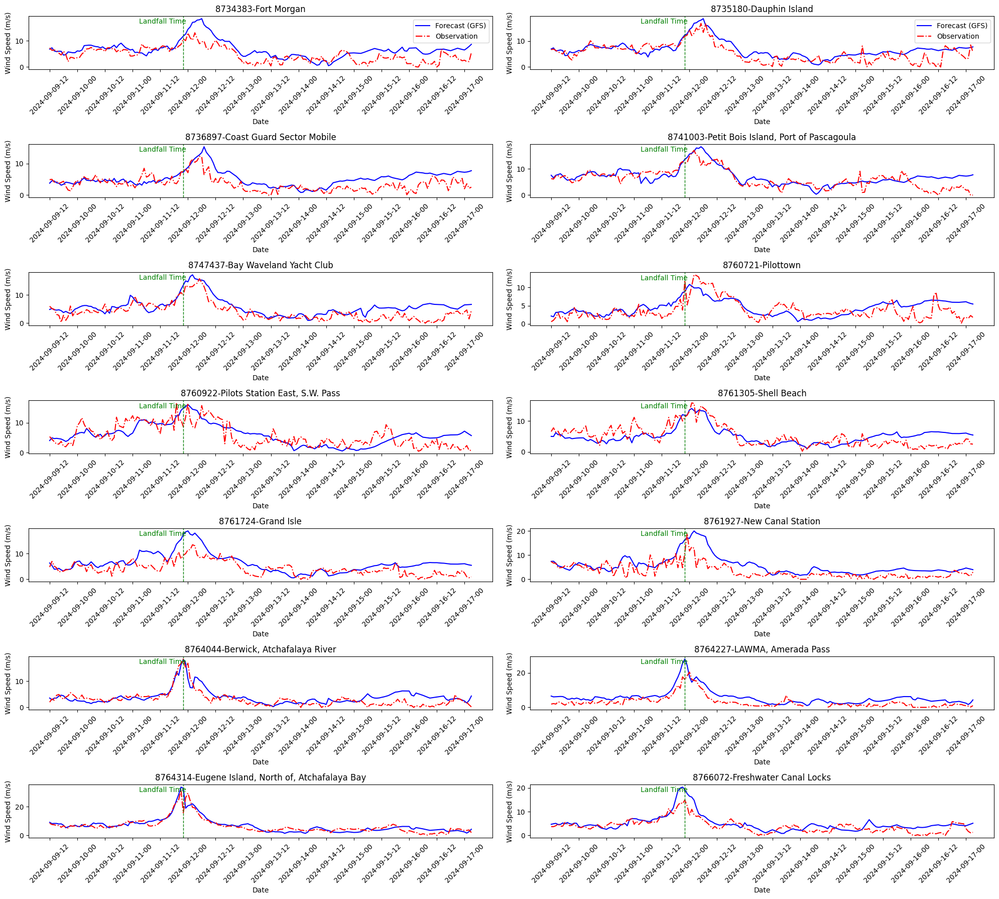

In [66]:

def convert_to_datetime(time_step):
    start_date = time_df['Time'][0]
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


# Define the number of rows and columns for subplots
num_rows = 7
num_cols = 2


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 18))



index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations['nos_id']):
            axs[row, col].axis('off')
            break
            
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        ax.plot(np.sqrt(u_wind_dfs_forecast[int(nos_id)]**2 + v_wind_dfs_forecast[int(nos_id)]**2)[:len(Wind_Observation_2d_forecast[0])], label='Forecast (GFS)', color='blue')
        ax.plot(Wind_Observation_2d_forecast[index].values, label='Observation', color='red',linestyle='dashdot')


        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')

        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_2d_forecast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_2d_forecast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]

        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        forecast_2d_landfall_time_step = None 
    
        for step, time_label in zip(time_steps, time_labels): 

            if time_label == landfall_datetime:
                 forecast_2d_landfall_time_step = step 
                 break   
        

        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        
        ax.axvline(x=forecast_2d_landfall_time_step, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*0.7, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0:
           ax.legend(loc='upper right')
        
        index += 1


# Adjust layout
plt.tight_layout()


# Save the figure
plt.savefig('GFS_Wind_Forecasting.png')


# Display the plot
plt.show()





# Read STOFS-3D-Atl input wind data for nowcast

In [ ]:

date = date_range[0]

base_key = f'stofs_3d_atl.{date}'

filename = f'schout_adcirc_{date}.nc'
         
key = f'STOFS-3D-Atl/{base_key}/{filename}'

bucket_name = bucket_name_3d

dataset = read_netcdf_from_s3(bucket_name, key)  # the first 24 hr (240 time steps are the now cast data)


def  get_indices_of_nearest_nodes(ds: xr.Dataset, x: float, y: float, num_nodes: int ) -> List[int]:
    # https://www.unidata.ucar.edu/blogs/developer/en/entry/accessing_netcdf_data_by_coordinates
    # https://github.com/Unidata/python-workshop/blob/fall-2016/notebooks/netcdf-by-coordinates.ipynb
    dist = abs(ds.x - x) ** 2 + abs(ds.y - y) ** 2
    indices_of_nearest_nodes = dist.argsort()[:num_nodes]
    return indices_of_nearest_nodes.values

# Initialize an empty DataFrame to store the data
index = pd.DataFrame()

# Initialize an empty DataFrame to store the data
data = []

for nos_id, x, y in zip(filtered_wind_stations['nos_id'], filtered_wind_stations['lon'], filtered_wind_stations['lat']):
    index_values = get_indices_of_nearest_nodes(dataset, x, y,1)
    data.append({'nos_id': nos_id , 'index_value': index_values})

# Convert the list of dictionaries to a DataFrame
index = pd.DataFrame(data)
index_list = []

for i in range(0,len(index)):
  index_list.append(int(index.index_value[i][0]))



In [ ]:

# Read STOFS-3d-Atlantic


bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1)  # to include all nowcast data for the specified range


dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYYMMDD
    current_date += timedelta(days=1)


wind_forecast_3d_all_list = []


for date in dates:
    print(date)
    base_key = f'stofs_3d_atl.{date}'
    previous_date = datetime.strptime(date, '%Y%m%d') - timedelta(days=1)
    filename = f'schout_adcirc_{previous_date.strftime("%Y%m%d")}.nc'
    key = f'STOFS-3D-Atl/{base_key}/{filename}'
    
    try:
        forecast_3d = read_netcdf_from_s3(bucket_name, key)
        
        # Calculate square root of sum of squares for uwind and vwind at specific points (nos_id)
        sqrt_uv_sum = np.sqrt(forecast_3d['uwind'][:, index_list]**2 + forecast_3d['vwind'][:, index_list]**2)
        
        # Store the result in a list
        wind_forecast_3d_all_list.append(sqrt_uv_sum)
        
    except Exception as e:
        print(f'Error reading file {key} from S3: {str(e)}')


# Concatenate all datasets along the time dimension
if wind_forecast_3d_all_list:
    wind_concat = xr.concat(wind_forecast_3d_all_list, dim='time')
else:
    print("No valid data found.")


wind_concat


# Read Wind_observation_data for STOFS-3D-Atl

In [ ]:
# Initialize an empty DataFrame to store the data
Wind_Observation_3d_nowcast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
   
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=wind_concat['time'].values[0],
       end_date=wind_concat['time'].values[-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_3d_nowcast.append(station_wind['speed'])
Wind_Observation_3d_nowcast

# Plot Wind nowcast data for STOFS-3D-Atl

In [ ]:

def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(wind_concat['time'].values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


# Define the number of rows and columns for subplots
num_rows = 7
num_cols = 2


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 18))



index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations['nos_id']):
            axs[row, col].axis('off')
            break
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        ax.plot(wind_concat[:,index], label='Nowcast (HRRR-GFS)', color='blue')
        ax.plot(Wind_Observation_3d_nowcast[index].values, label='Observation', color='red',linestyle='dashdot')


        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')

        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_3d_nowcast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_3d_nowcast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]
        
        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        nowcast_3d_landfall_time_step = None 

        for step, time_label in zip(time_steps, time_labels): 

            if time_label.replace(tzinfo = None) == landfall_datetime:
               nowcast_3d_landfall_time_step = step 
               break 

        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        ax.axvline(x=nowcast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
        ax.text(nowcast_3d_landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0:
           ax.legend(loc='upper right')
        
        index += 1


# Adjust layout
plt.tight_layout()


# Save the figure
plt.savefig('STOFS_3D_Wind_Nowcast.png')

# Display the plot
plt.show()




# Read wind Forecast from STOFS-3D-Atl

In [ ]:
# Read STOFS-3d-Atlantic


bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = start_date + timedelta(days=5) # Forecast data provided in each STOFS-3D-Atl cycle


# Find the forecast date

dates = []

forecast_date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')

current_date = datetime.strptime(forecast_date, '%Y%m%d')-timedelta(days=1) #starting from nowcast data
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYYMMDD
    current_date += timedelta(days=1)


wind_forecast_3d_all_list = []

for date in dates:
    print(date)
    base_key = f'stofs_3d_atl.{forecast_date}'
    filename = f'schout_adcirc_{date}.nc'
    key = f'STOFS-3D-Atl/{base_key}/{filename}'
    
    try:
        wind_forecast_3d = read_netcdf_from_s3(bucket_name, key)
        
        # Calculate square root of sum of squares for uwind and vwind at specific points (nos_id)
        sqrt_uv_sum = np.sqrt(wind_forecast_3d['uwind'][:, index_list]**2 + wind_forecast_3d['vwind'][:, index_list]**2)
        
        # Store the result in a list
        wind_forecast_3d_all_list.append(sqrt_uv_sum)
        
    except Exception as e:
        print(f'Error reading file {key} from S3: {str(e)}')


# Concatenate all datasets along the time dimension
if wind_forecast_3d_all_list:
    wind_concat_forecast = xr.concat(wind_forecast_3d_all_list, dim='time')
else:
    print("No valid data found.")


wind_concat_forecast


# Read Observation data for forecast wind

In [ ]:
# Initialize an empty DataFrame to store the data
Wind_Observation_3d_forecast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
       print(nos_id)
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=wind_concat_forecast['time'].values[0],
       end_date=wind_concat_forecast['time'].values[-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_3d_forecast.append(station_wind['speed'])
Wind_Observation_3d_forecast

# Plot wind forecast for STOFS-3D-Atl

In [ ]:
def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(wind_concat_forecast['time'].values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


# Define the number of rows and columns for subplots
num_rows = 7
num_cols = 2


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 18))



index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations['nos_id']):
            axs[row, col].axis('off')
            break
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        ax.plot(wind_concat_forecast[:len(Wind_Observation_3d_forecast[0]),index], label='Forecast (HRRR-GFS)', color='blue')
        ax.plot(Wind_Observation_3d_forecast[index].values, label='Observation', color='red',linestyle='dashdot')


        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')

        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_3d_forecast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_3d_forecast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]
        
        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        forecast_3d_landfall_time_step = None 

        for step, time_label in zip(time_steps, time_labels): 

            if time_label.replace(tzinfo = None) == landfall_datetime:
               forecast_3d_landfall_time_step = step 
               break 

        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        ax.axvline(x=forecast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0:
           ax.legend(loc='upper right')
        
        index += 1


# Adjust layout
plt.tight_layout()


# Save the figure
plt.savefig('STOFS_3D_Wind_forecast.png')

# Display the plot
plt.show()
